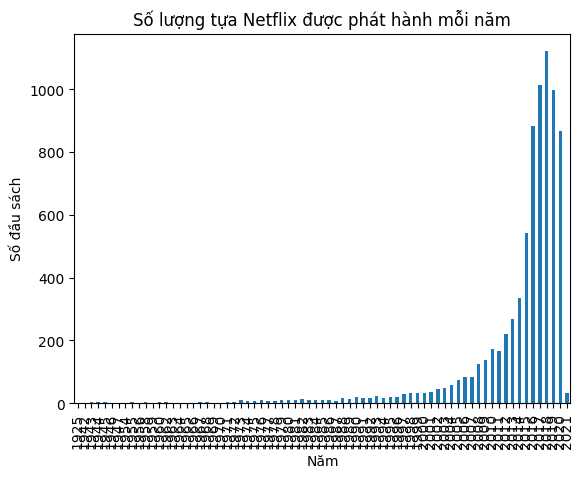

In [1]:
"Tạo hàm Code này dùng để chuẩn bị dữ liệu và tải dữ liệu từ các tệp CSV, sau đó đọc các tệp này vào DataFrame và thực hiện một ví dụ vẽ biểu đồ đơn giản để kiểm tra dữ liệu đã được đọc"
"Chuẩn bị môi trường: Thiết lập các thư viện cần thiết và xử lý cảnh báo."
"Tải dữ liệu: đọc dữ liệu từ các tệp CSV trên máy tính."
"Kiểm tra dữ liệu: Đọc các tệp CSV vào DataFrame và vẽ biểu đồ để kiểm tra dữ liệu"
import pandas as pd  # Import thư viện pandas và đặt tên viết tắt là pd
import numpy as np  # Import thư viện numpy và đặt tên viết tắt là np
import matplotlib.pyplot as plt  # Import thư viện matplotlib.pyplot và đặt tên viết tắt là plt
import warnings  # Import thư viện warnings để xử lý cảnh báo
import os  # Import thư viện os để thao tác với hệ điều hành

warnings.filterwarnings('ignore')  # Bỏ qua các cảnh báo để tránh làm rối mắt

# Đường dẫn trực tiếp tới file trên máy tính
nx_file_path = r"D:\KhoaHocDuLieu\KhoaHocDuLieu\data\netflix_titles.csv"  # Đường dẫn tới file Netflix trên máy tính
imdb_m_file_path = r"D:\KhoaHocDuLieu\KhoaHocDuLieu\data\IMDb_movies.csv"  # Đường dẫn tới file IMDb Movies trên máy tính
imdb_r_file_path = r"D:\KhoaHocDuLieu\KhoaHocDuLieu\data\IMDb_ratings.csv"  # Đường dẫn tới file IMDb Ratings trên máy tính

# Kiểm tra sự tồn tại của các file
if not os.path.exists(nx_file_path):  # Nếu file Netflix không tồn tại
    raise FileNotFoundError(f"{nx_file_path} does not exist.")  # Báo lỗi không tìm thấy file
if not os.path.exists(imdb_m_file_path):  # Nếu file IMDb Movies không tồn tại
    raise FileNotFoundError(f"{imdb_m_file_path} does not exist.")  # Báo lỗi không tìm thấy file
if not os.path.exists(imdb_r_file_path):  # Nếu file IMDb Ratings không tồn tại
    raise FileNotFoundError(f"{imdb_r_file_path} does not exist.")  # Báo lỗi không tìm thấy file

# Đọc các file CSV
nx_df = pd.read_csv(nx_file_path)  # Đọc file Netflix và lưu vào DataFrame
imdb_m_df = pd.read_csv(imdb_m_file_path)  # Đọc file IMDb Movies và lưu vào DataFrame
imdb_r_df = pd.read_csv(imdb_r_file_path)  # Đọc file IMDb Ratings và lưu vào DataFrame

# Ví dụ vẽ biểu đồ để kiểm tra dữ liệu đã được đọc
nx_df['release_year'].value_counts().sort_index().plot(kind='bar')  # Đếm số lượng tiêu đề Netflix theo năm phát hành và vẽ biểu đồ cột
plt.title('Số lượng tựa Netflix được phát hành mỗi năm')  # Đặt tiêu đề cho biểu đồ
plt.xlabel('Năm')  # Đặt nhãn cho trục x
plt.ylabel('Số đầu sách')  # Đặt nhãn cho trục y
plt.show()  # Hiển thị biểu đồ


In [2]:
"Tạo hàm Code này được sử dụng để kết hợp dữ liệu từ hai nguồn khác nhau (Netflix và IMDb), làm sạch và chuẩn hóa dữ liệu"
" 1. Kết hợp dữ liệu: Gộp hai DataFrame (nx_df và imdb_m_df) dựa trên cột 'title' để có thêm thông tin từ IMDb."
" 2. Loại bỏ trùng lặp: Xóa các hàng trùng lặp dựa trên 'show_id' để đảm bảo mỗi mục chỉ xuất hiện một lần."
" 3. Xử lý giá trị thiếu: Thay thế các giá trị NaN trong cột 'director', 'cast', và 'country' của nx_df bằng các giá trị tương ứng từ IMDb."
" 4. Loại bỏ cột không cần thiết: Xóa các cột không cần thiết sau khi kết hợp dữ liệu để giữ cho DataFrame gọn gàng và chỉ chứa các thông tin quan trọng."
#------------------
# Thực hiện việc kết hợp trái giữa hai DataFrame nx_df và imdb_m_df dựa trên cột 'title'
# và lấy tất cả các dòng từ nx_df và các cột tương ứng từ imdb_m_df
nx_df = nx_df.merge(imdb_m_df, on='title', how='left', suffixes=('', '_y'))

# Loại bỏ bất kỳ hàng trùng lặp nào từ kết quả kết hợp
nx_df = nx_df.drop_duplicates(subset='show_id').reset_index(drop=True)

# Tìm bất kỳ ô NaN nào từ nx_df và thay thế nó bằng giá trị tương ứng từ imdb_m_df
nx_df['director'][nx_df['director'].isnull()] = nx_df['director_y']
nx_df['cast'][nx_df['cast'].isnull()] = nx_df['actors']
nx_df['country'][nx_df['country'].isnull()] = nx_df['country_y']

# Xây dựng danh sách cột thích hợp cần loại bỏ từ nx_df
imdb_cols = imdb_m_df.columns.to_list()
[imdb_cols.remove(c) for c in ['title', 'country', 'director', 'duration', 'description']]
[imdb_cols.append(c) for c in ['country_y', 'director_y', 'duration_y', 'description_y']]

# Loại bỏ bất kỳ cột không cần thiết nào
nx_df.drop(columns=imdb_cols, inplace=True)


Có nhiều phim hiện có hơn chương trình truyền hình!
Movies: 5377 | TV Shows: 2410


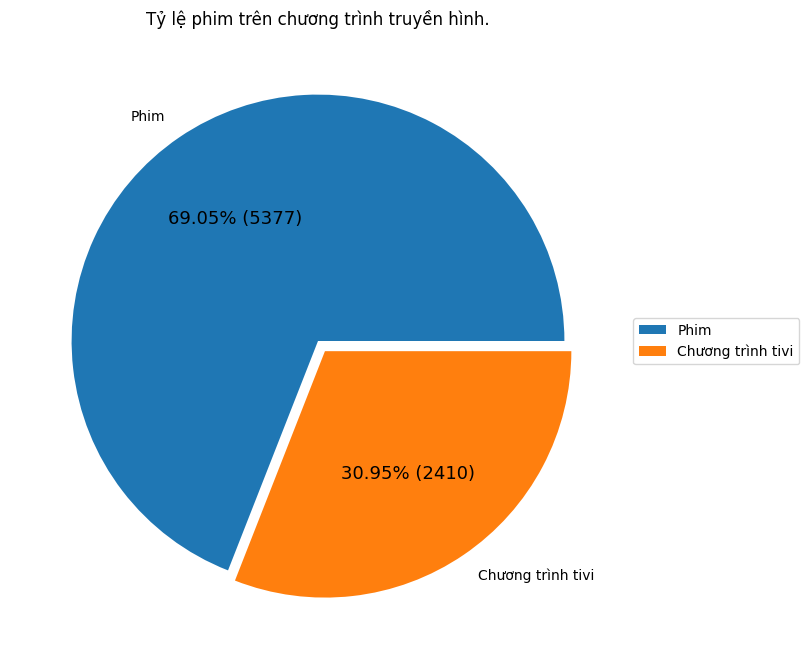

In [3]:
" Tạo hàm Code này được sử dụng để tính toán và so sánh số lượng phim và chương trình TV trong dataset của Netflix. Sau đó, nó hiển thị kết quả này dưới dạng biểu đồ tròn"
'''
Trong tập dữ liệu Netflix, tồn tại một trong hai phim
hoặc chương trình truyền hình, vì vậy nếu tìm được tổng số phim, chúng ta
có thể tự động tính toán số lượng Chương trình TV, vì
tổng số hàng đang được lưu trữ trong pandas.DataFrame.
'''

# Lấy tổng số phim
total_movies = nx_df['type'].where(nx_df['type'] == 'Movie').count()
# Lấy tổng số hàng
total_rows = nx_df.index.stop

# Nếu tổng số phim lớn hơn một nửa số hàng của dataframe, có nhiều phim hơn
if total_movies > total_rows // 2:
    print('Có nhiều phim hiện có hơn chương trình truyền hình!') 
# Nếu tổng số phim nhỏ hơn một nửa số hàng của dataframe, có nhiều chương trình TV hơn
elif total_movies < total_rows // 2:
    print('Hiện có nhiều chương trình truyền hình hơn phim!')
# Nếu không, số lượng phim bằng số lượng chương trình TV
else:
    print('Phim truyền hình và phim đều bình đẳng!')
print(f'Movies: {total_movies} | TV Shows: {total_rows - total_movies}')

# Vẽ biểu đồ tròn để hiển thị kết quả
fig, ax = plt.subplots(figsize=(8, 8))

wedges, texts, autotexts = plt.pie(x=[total_movies, total_rows - total_movies], labels=['Phim', 'Chương trình tivi'], 
        explode=(0, 0.05), autopct=lambda p: '{:.2f}% ({:.0f})'.format(p, (p/100)*total_rows))

ax.legend(wedges, ['Phim', 'Chương trình tivi'],
          loc="center left",
          bbox_to_anchor=(1, 0, 0.5, 1))

plt.setp(autotexts, size=13)

ax.set_title("Tỷ lệ phim trên chương trình truyền hình.")

plt.show()


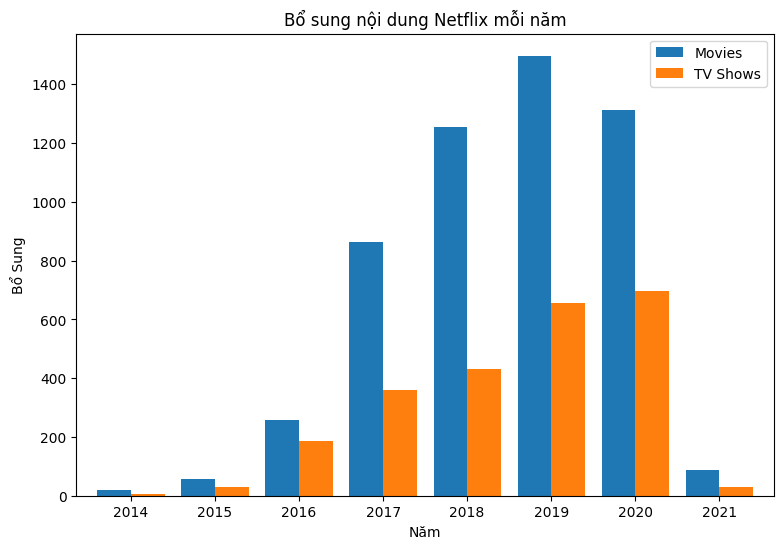

In [4]:
"Tạo hàm code sử dụng để phân tích và hiển thị thông tin về số lượng phim và chương trình TV được thêm vào Netflix mỗi năm"
def get_info2(nx_df, title):  # `title` có thể là 'Movie' hoặc 'TV Show'
    # Lấy thông tin các tiêu đề và ngày thêm vào từ DataFrame, chỉ giữ các hàng có `type` khớp với `title`
    info = nx_df[['type', 'date_added']].where(nx_df['type'] == title).dropna()
    
    # Thay thế trường 'date_added' bằng năm thêm vào (chỉ giữ 4 chữ số cuối của ngày)
    info['date_added'] = info.apply(lambda row: str(row.date_added)[-4:], axis=1)
    # Nhóm các hàng theo năm thêm vào và đếm số lượng hàng trong mỗi nhóm
    info = info.groupby(by=['date_added']).count()
    # Đổi tên cột 'type' thành 'Movies' hoặc 'TV Shows' tùy thuộc vào giá trị của `title`
    info.rename({'type': (title + 's')}, axis=1, inplace=True)
    return info  # Trả về DataFrame đã được xử lý

def content_additions(latest_years_to_show=8):
    # Gọi hàm `get_info2` để lấy thông tin về phim và chương trình TV
    movie_info = get_info2(nx_df, 'Movie')
    show_info = get_info2(nx_df, 'TV Show')

    # Ghép nối Movies và Shows theo năm, và điền NaN bằng 0, cho biết các năm không có Movies hoặc Series.
    total_info = pd.concat([movie_info, show_info], axis=1).fillna(0)
    # Đảm bảo các cột 'Movies' và 'TV Shows' là kiểu số nguyên
    total_info[['Movies', 'TV Shows']] = total_info[['Movies', 'TV Shows']].astype(int)

    # Lấy dữ liệu của những năm gần đây nhất để hiển thị
    total_info.tail(latest_years_to_show).plot(kind='bar', legend=True, width=0.8, xlabel='Năm', 
                                               ylabel='Bổ Sung', title='Bổ sung nội dung Netflix mỗi năm', figsize=(9, 6))
    # Đặt các nhãn trục x thẳng hàng
    plt.xticks(rotation=0)
    # Hiển thị biểu đồ
    plt.show()

# Gọi hàm `content_additions` để thực hiện toàn bộ quá trình và hiển thị biểu đồ
content_additions()


Country with the most content is United States, having produced 3297 movies and tv shows.


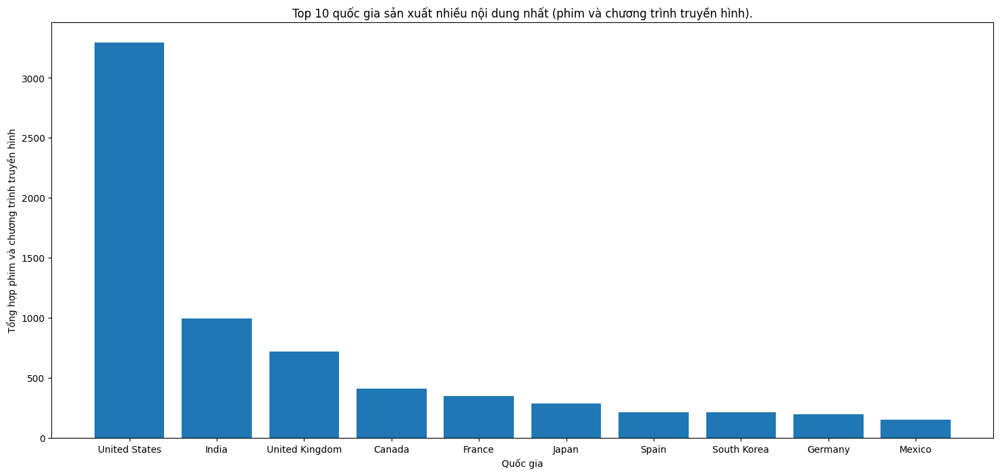

In [5]:
"Code này được sử dụng để phân tích và minh họa số lượng sản phẩm (phim và chương trình truyền hình) được sản xuất bởi từng quốc gia trong dataset Netflix. Các bước thực hiện trong code bao gồm:"
"Mục tiêu:"
"Tạo từ điển chứa số lượng sản phẩm của mỗi quốc gia."
"Xác định quốc gia có nhiều nội dung nhất."
"Vẽ biểu đồ cột để minh họa các quốc gia sản xuất nhiều nội dung nhất."
'''
Lưu tất cả các quốc gia tham gia vào một từ điển
và lưu số lượng sản phẩm của mỗi quốc gia.
Ví dụ: {Greece: 15, France: 26, Russia: 45}
'''
def countries_content(df, countries={}):
    # Đối với mỗi hàng trong cột 'country' mà không có giá trị NaN
    for producers in df['country'].dropna():
        # Tách hàng thành nhiều quốc gia (nếu cần)
        for country in str(producers).strip().split(','):
            c = country.strip()
            # Lưu mỗi quốc gia vào từ điển, tăng số đếm nếu quốc gia đã tồn tại
            countries[c] = 1 if c not in countries else countries[c] + 1
    return countries

# Gọi hàm `countries_content` để tạo từ điển `countries` chứa số lượng sản phẩm của mỗi quốc gia
countries = countries_content(nx_df)

# Quốc gia có nhiều nội dung nhất đơn giản là giá trị lớn nhất trong từ điển quốc gia
win_countr = max(countries, key=countries.get)

# In ra quốc gia có nhiều nội dung nhất và số lượng sản phẩm của quốc gia đó
print(f'Country with the most content is {win_countr}, having produced {countries[win_countr]} movies and tv shows.')

# Sắp xếp các quốc gia theo số lượng sản phẩm từ cao đến thấp
countries = dict(sorted(countries.items(), key=lambda item: item[1], reverse=True))

# Chọn số lượng quốc gia hàng đầu để hiển thị trong biểu đồ
topn = 10

# Tạo biểu đồ cột để minh họa
fig, ax = plt.subplots(1, 1, figsize=[18, 8])
plt.bar(x=[i for j, i in enumerate(countries) if j < topn], height=[countries[i] for j, i in enumerate(countries) if j < topn])

# Đặt tiêu đề và nhãn cho biểu đồ
ax.set_title(f'Top {topn} quốc gia sản xuất nhiều nội dung nhất (phim và chương trình truyền hình).')
ax.set_xlabel('Quốc gia')
ax.set_ylabel('Tổng hợp phim và chương trình truyền hình')

# Hiển thị biểu đồ
plt.show()


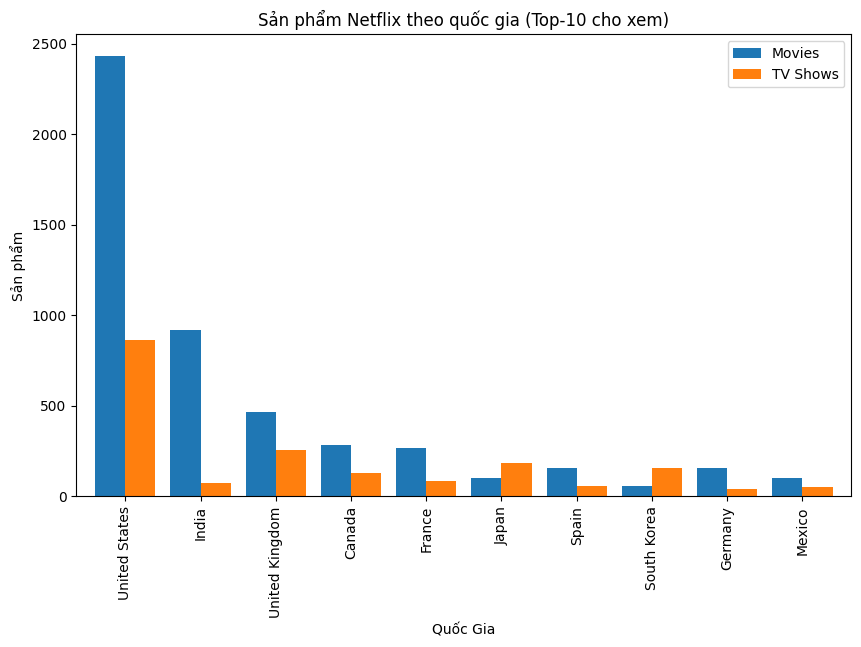

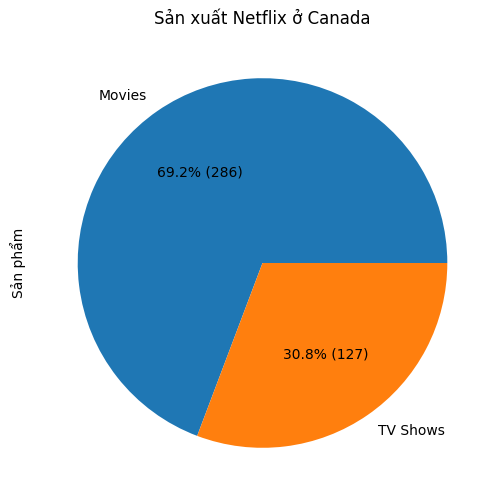

In [6]:
"Tạo hàm Code này được sử dụng để phân tích thông tin về nội dung phim và chương trình TV trên Netflix theo quốc gia"
def get_info4(nx_df, title):  # title is either 'Movie' or 'TV Show'
    # Lấy loại nội dung và các quốc gia sản xuất
    info = nx_df[['type', 'country']].where(nx_df['type'] == title).dropna()
    # Tạo các hàng mới, mỗi hàng chỉ có đúng 1 quốc gia (bằng cách tách các sản phẩm đa quốc gia)
    info['country'] = info['country'].str.strip().str.split(',')
    info = info.explode('country')
    info['country'] = info['country'].str.strip()
    # Nhóm các hàng theo quốc gia và đếm số lượng hàng trong mỗi nhóm
    info = info.groupby(by=['country']).count()
    # Đổi tên cột 'type' thành 'Movies' hoặc 'TV Shows' tùy thuộc vào giá trị của `title`
    info.rename({'type': (title + 's')}, axis=1, inplace=True)
    return info  # Trả về DataFrame đã được xử lý

def content_per_country():
    # Gọi hàm `get_info4` để lấy thông tin về phim và chương trình TV
    movie_info = get_info4(nx_df, 'Movie')
    show_info = get_info4(nx_df, 'TV Show')

    # Ghép nối Movies và Shows theo quốc gia, và điền NaN bằng 0,
    # cho biết các quốc gia không có Movies hoặc Series sản xuất
    total_info = pd.concat([movie_info, show_info], axis=1).fillna(0)
    total_info[['Movies', 'TV Shows']] = total_info[['Movies', 'TV Shows']].astype(int)
    
    # Tạo cột tạm thời 'f' bằng tổng số phim và chương trình TV
    total_info = total_info.assign(f = total_info['Movies'] + 
                total_info['TV Shows']).sort_values('f', ascending=False).drop('f', axis=1)

    # Định nghĩa hàm con để vẽ biểu đồ
    def plot_content_by_country(info, topk=10, country=None):
        if country is not None and country in info.index:
            # Tính tổng số sản phẩm (phim và chương trình TV) của một quốc gia cụ thể
            total_prod = info.loc[country]['Movies'] + info.loc[country]['TV Shows']
            # Vẽ biểu đồ tròn cho quốc gia đó
            info.loc[country].plot(kind='pie', figsize=(6, 6), autopct=lambda p: '{:.1f}% ({:.0f})'.format(p, (p/100)*total_prod),
                                   title=f'Sản xuất Netflix ở {country}', ylabel='Sản phẩm')
        else:
            # Vẽ biểu đồ cột cho top `topk` quốc gia có nhiều sản phẩm nhất
            info.head(topk).plot(kind='bar', legend=True, width=0.8, xlabel='Quốc Gia', figsize=(10, 6),
                                 ylabel='Sản phẩm', title=f'Sản phẩm Netflix theo quốc gia (Top-{topk} cho xem)')
        plt.show()
        print()

    # Gọi hàm vẽ biểu đồ cho top 10 quốc gia có nhiều sản phẩm nhất
    plot_content_by_country(total_info, topk=10)
    # Gọi hàm vẽ biểu đồ cho quốc gia Canada
    plot_content_by_country(total_info, country='Canada')

# Gọi hàm `content_per_country` để thực hiện toàn bộ quá trình
content_per_country()


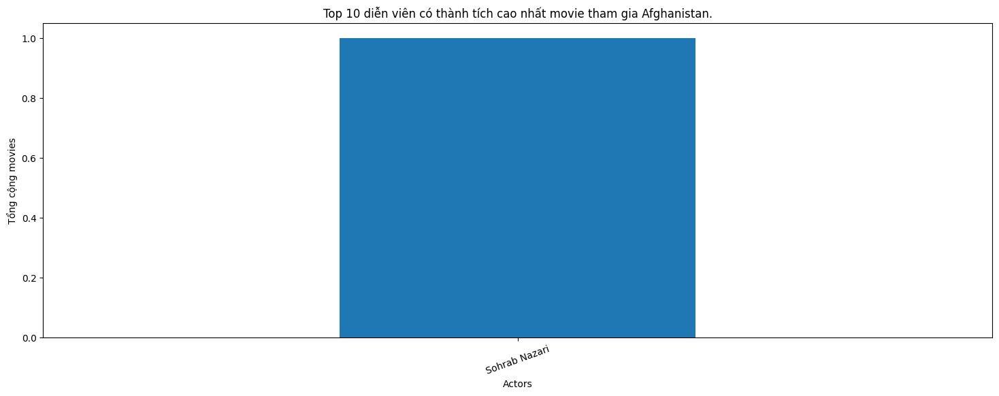

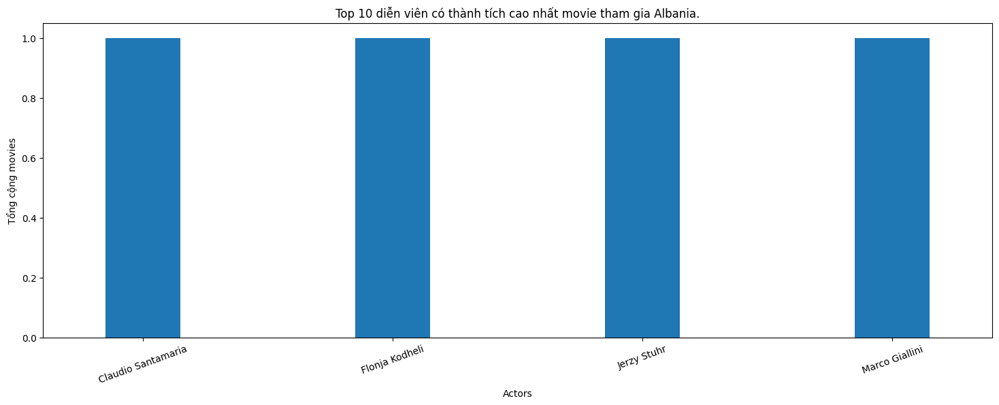

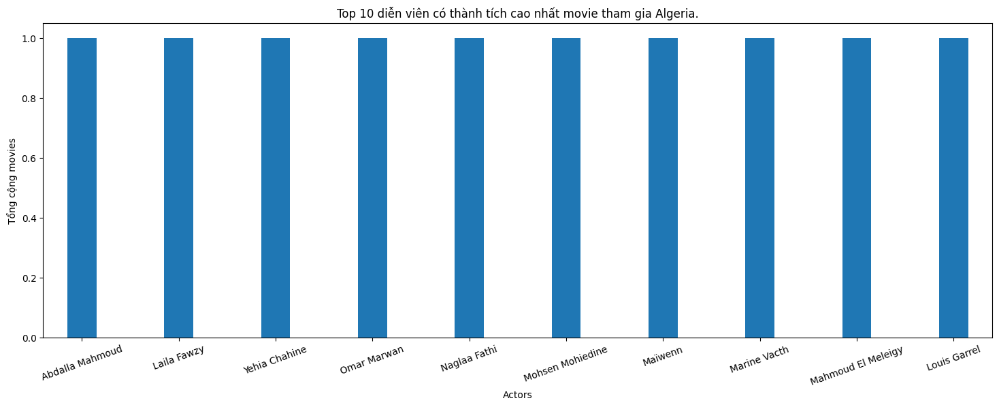

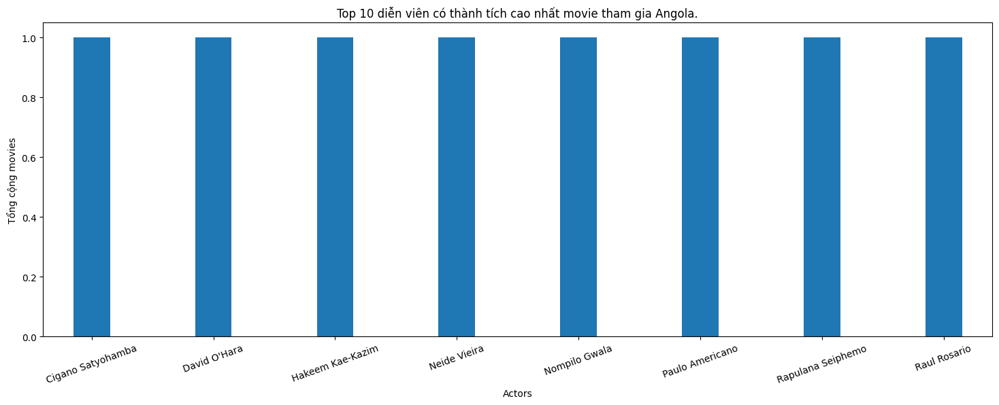

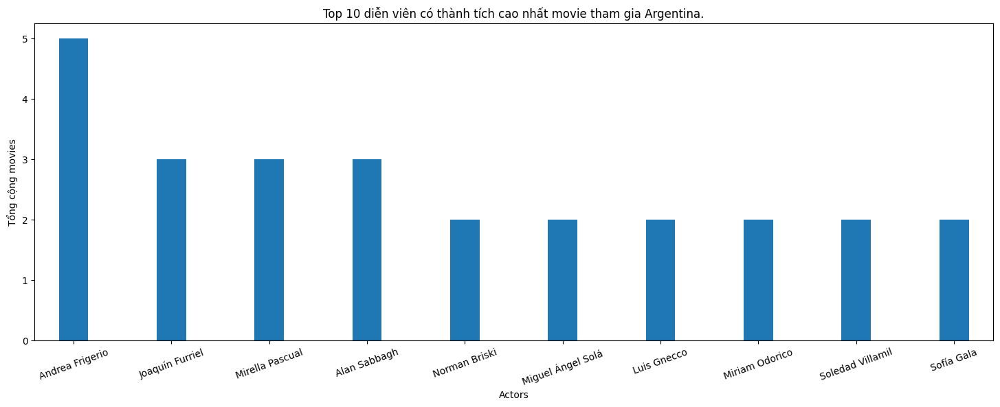

...

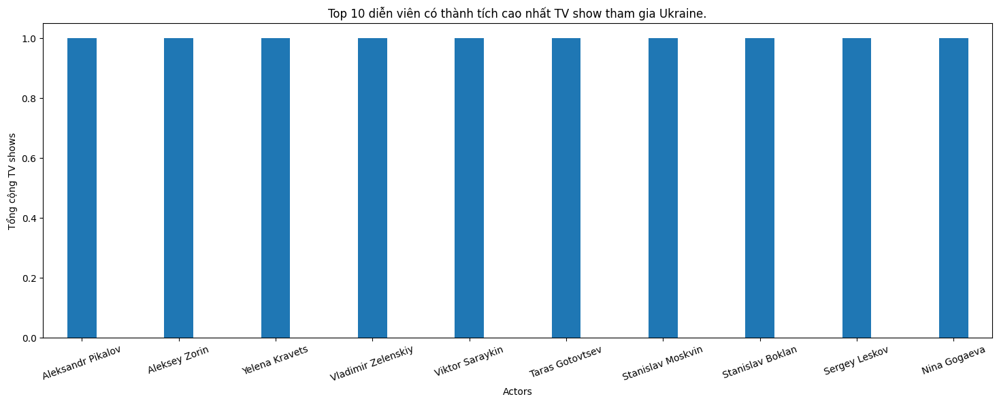

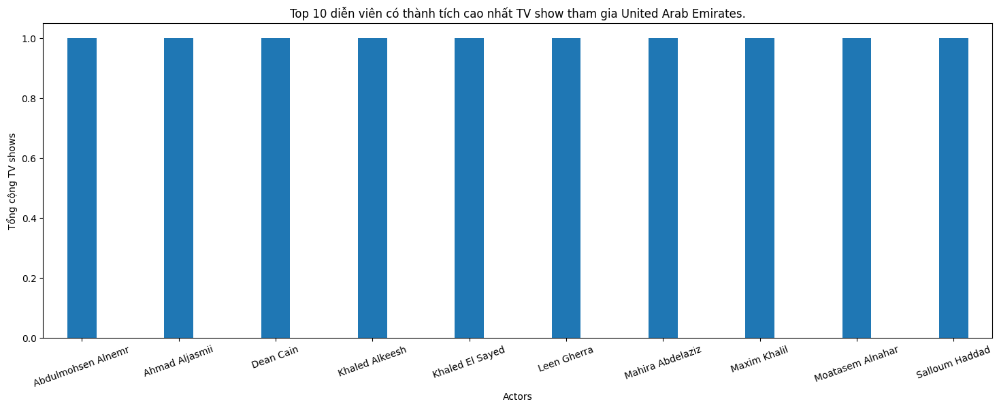

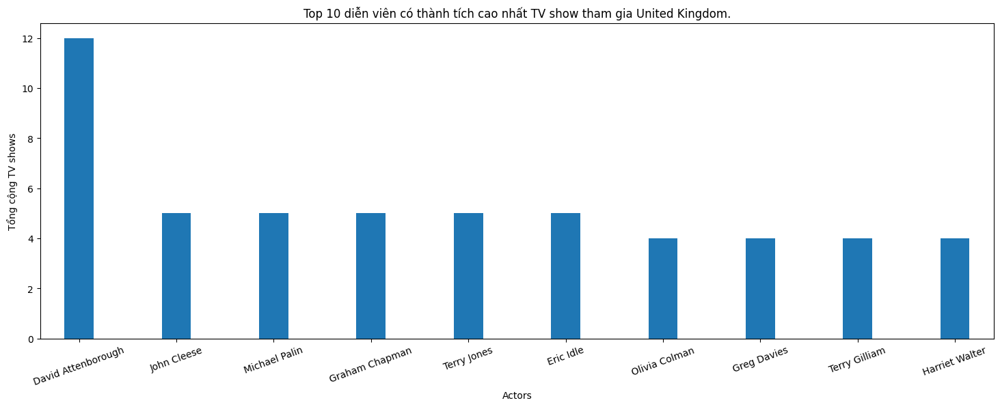

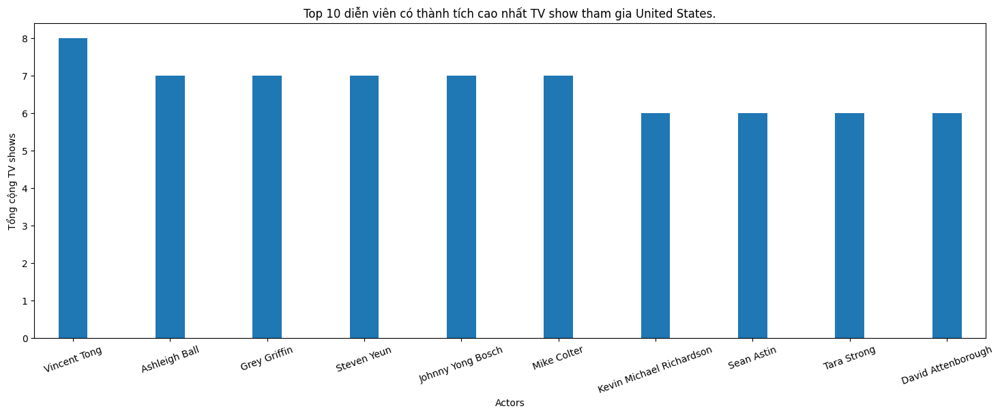

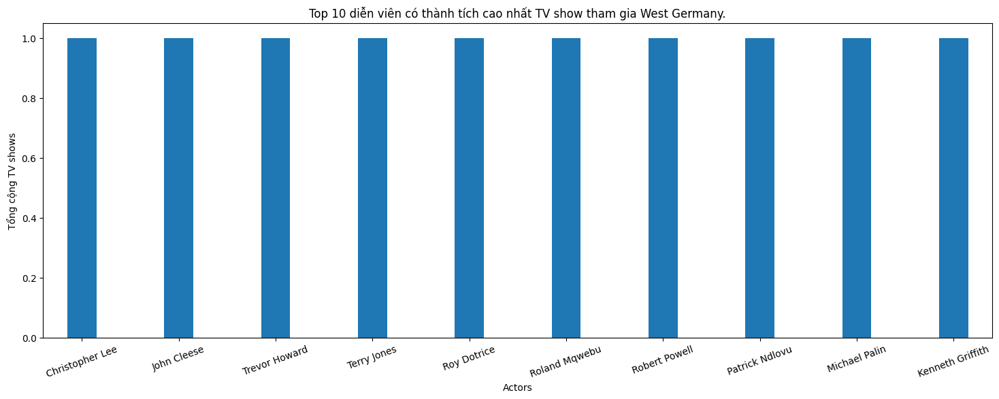

In [7]:
"Tạo hàm Code này giúp bạn hiểu được phân bố diễn viên và mức độ tham gia của họ vào các sản phẩm phim và chương trình truyền hình theo quốc gia, từ đó có cái nhìn tổng quan về ngành công nghiệp giải trí trên Netflix."
'''
Hàm tiện ích để:
> Phân tách các trường của một cột cụ thể thành nhiều hàng riêng biệt
> Làm sạch khoảng trắng và '\n' từ các trường của một cột cụ thể
'''
def clean_explode(df, column):
    # Loại bỏ khoảng trắng và phân tách các giá trị của cột thành danh sách
    df[column] = df[column].str.strip().str.split(',')
    # Phân tách các danh sách thành các hàng riêng biệt
    df = df.explode(column)
    # Loại bỏ khoảng trắng từ các giá trị trong cột
    df[column] = df[column].apply(lambda x: str(x).strip())
    # Đặt lại chỉ số của DataFrame
    df = df.reset_index(drop=True)
    return df

'''
Tính toán và vẽ biểu đồ các diễn viên tham gia nhiều sản phẩm nhất 
(phim và chương trình truyền hình riêng biệt) trong mỗi quốc gia có trong tập dữ liệu
'''
def actors_per_country(info, ptype='movie'):

    # Phân tách đúng cách các trường cần thiết
    info = clean_explode(info, 'cast')
    info = clean_explode(info, 'country')
    
    # Nhóm theo quốc gia và diễn viên và đếm số lượng sản phẩm
    results = pd.DataFrame(info.groupby(by=['country', 'cast']).count()).reset_index()
    results.columns = ['country', 'actors', 'num_of_mov_part']

    # Làm sạch dữ liệu thêm
    results = results.replace(to_replace='', value=float('NaN'))
    results.dropna(inplace=True)

    # Đối với mỗi quốc gia duy nhất
    countries = {}
    for country in results['country'].unique():
        if country not in countries:
            countries[country] = 1

            # Tạo một DataFrame mới gồm tất cả các diễn viên của quốc gia hiện tại
            # và tổng số sản phẩm của họ
            country_df = pd.DataFrame(results[results['country'] == country])
            country_df = country_df.sort_values(by='num_of_mov_part', ascending=False)
            
            # Vẽ biểu đồ kết quả (top N)
            topn = 10
            country_df.head(topn).plot(x='actors', y='num_of_mov_part', kind='bar', width=0.3, xlabel='Actors', legend=False,
                    ylabel=f'Tổng cộng {ptype}s', title=f'Top {topn} diễn viên có thành tích cao nhất {ptype} tham gia {country}.', figsize=[18, 6])

            plt.xticks(rotation=20)
            plt.show()

# Lấy chỉ các cột cần thiết
info = nx_df[['type', 'country', 'cast', 'show_id']]
# Loại bỏ các giá trị NaN
info.dropna(inplace=True)
info = info.reset_index(drop=True)

# Chia tập dữ liệu ban đầu thành hai tập riêng biệt (Phim và Chương trình truyền hình)
info_mov = info[info['type'] == 'Movie'].reset_index(drop=True)
info_tv = info[info['type'] == 'TV Show'].reset_index(drop=True)

# Gọi hàm `actors_per_country` cho dữ liệu phim
actors_per_country(info_mov.drop(columns='type'))
# Gọi hàm `actors_per_country` cho dữ liệu chương trình truyền hình
actors_per_country(info_tv.drop(columns='type'), 'TV show')


In [8]:
"Hàm này giúp bạn hiểu được phân phối của các nhóm tuổi xem chương trình trên Netflix dựa trên các rating được cung cấp."
"Đây là một hàm được thiết kế để xử lý và biến đổi dữ liệu về đánh giá rating của các loại chương trình trên Netflix."
def map_rating_to_age(rating):
  # Tạo một từ điển ages, với key là các nhóm tuổi và value là danh sách các rating tương ứng.
  ages = { 'Những đứa trẻ con' : ['G', 'TV-Y', 'TV-G'],
           'Trẻ lớn hơn' : ['PG', 'TV-Y7', 'TV-Y7-FV', 'TV-PG'],
           'Thanh thiếu niên' : ['PG-13', 'TV-14'],
           'Trưởng thành' : ['R', 'NC-17', 'TV-MA'] }
  # Duyệt qua từng nhóm tuổi trong ages
  for age in ages.keys():
    # Nếu rating nằm trong danh sách rating của một nhóm tuổi, trả về tên của nhóm tuổi đó
    if rating in ages[age]:
      return age
  # Nếu không tìm thấy phù hợp, trả về chuỗi rỗng
  return ''

def get_info6(nx_df, title):
  # Lấy thông tin type và rating từ dataframe nx_df dựa trên tiêu đề title
  info = nx_df[['type', 'rating']].where(nx_df['type'] == title).dropna()
  # Tạo các hàng mới, mỗi hàng có đúng 1 rating (bằng cách tách các production có nhiều rating)
  info['rating'] = info['rating'].str.strip().str.split(',')
  info = info.explode('rating')
  # Chuyển đổi các rating thành Group Age (Little Kids, Teens, v.v.)
  info['rating'] = info.apply(lambda row : map_rating_to_age(row.rating), axis=1)
  # Loại bỏ các Ratings không có sự phù hợp với một Group Age dựa trên mảng age
  info = info[ info['rating'] != '' ]
  # Nhóm các thông tin theo rating, đếm số lượng và đặt lại index
  info = info.groupby(by=['rating']).count().reset_index()
  # Đổi tên cột 'type' thành (title + 's'), và cột 'rating' thành 'Rating'
  info = info.rename({'type' : (title + 's'), 'rating' : 'Rating'}, axis=1)
  # Sắp xếp dữ liệu theo số lượng giảm dần và đặt lại index
  info = info.sort_values(by=[title + 's'], ascending=False).set_index('Rating')
  return info


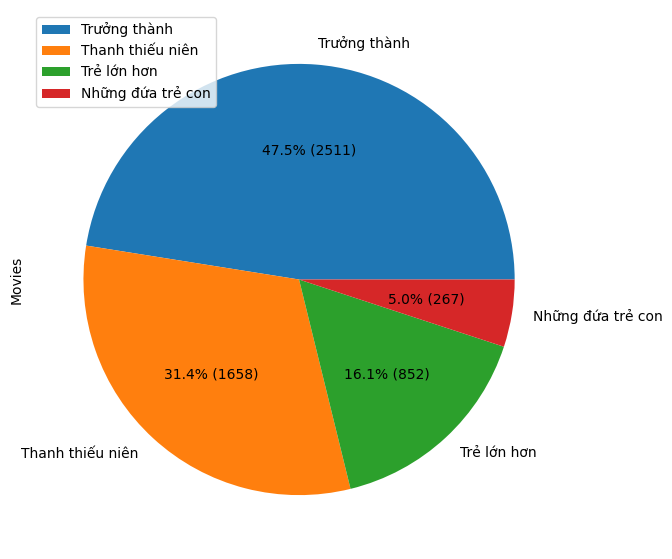

In [9]:
"Hàm rating_among_movies() này giúp bạn có cái nhìn trực quan về phân phối của các nhóm tuổi xem phim trên Netflix, cho biết tỉ lệ phần trăm của mỗi nhóm tuổi so với tổng số lượng các bộ phim."
def rating_among_movies():
  # Gọi hàm get_info6 để lấy thông tin về các bộ phim (Movies)
  movie_info = get_info6(nx_df, 'Movie')
  # Tính tổng số lượng bộ phim
  total_movies = movie_info['Movies'].sum()
  # Vẽ biểu đồ pie dựa trên thông tin về rating của các bộ phim
  movie_info.plot(kind='pie', subplots=True, figsize=(7, 7), 
                  autopct=lambda p: '{:.1f}% ({:.0f})'.format(p, (p/100)*total_movies))
  # Hiển thị biểu đồ
  plt.show()

# Gọi hàm rating_among_movies()
rating_among_movies()


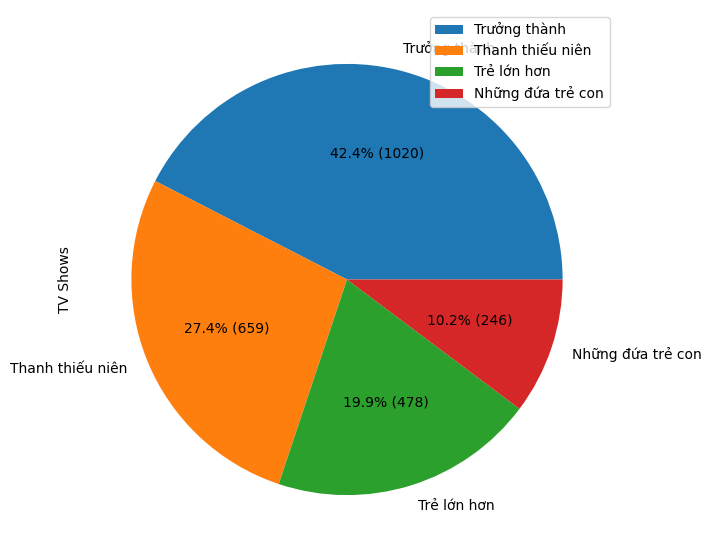

In [10]:
"Hàm này giống bên trên nhưng show ra của CHương trình tivi"
def rating_among_shows():
  # Gọi hàm get_info6 để lấy thông tin về các show truyền hình (TV Shows)
  show_info = get_info6(nx_df, 'TV Show')
  # Tính tổng số lượng series
  total_series = show_info['TV Shows'].sum()
  # Vẽ biểu đồ pie dựa trên thông tin về rating của các series truyền hình
  show_info.plot(kind='pie', subplots=True, figsize=(7, 7), 
                  autopct=lambda p: '{:.1f}% ({:.0f})'.format(p, (p/100)*total_series))
  # Hiển thị biểu đồ
  plt.show()

# Gọi hàm rating_among_shows()
rating_among_shows()


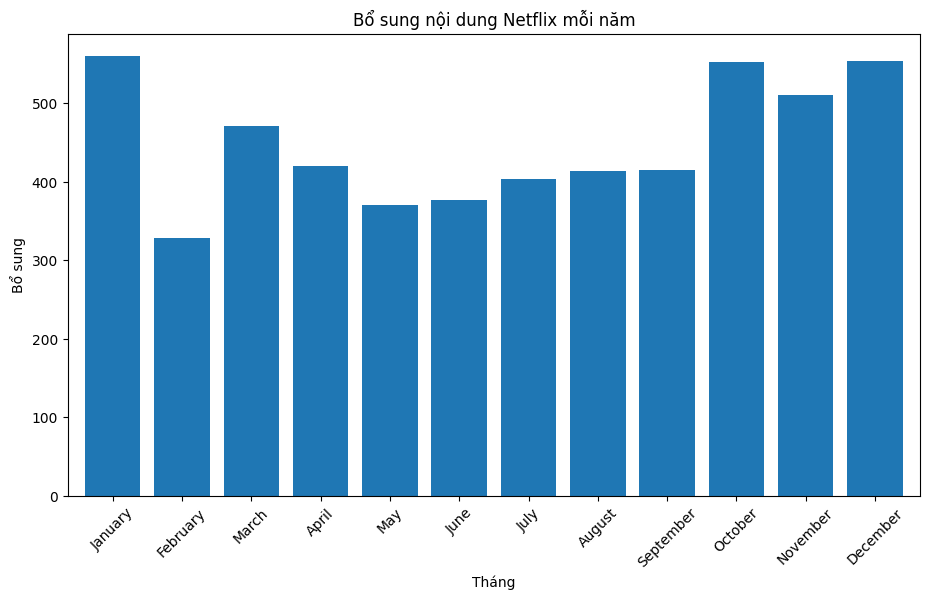

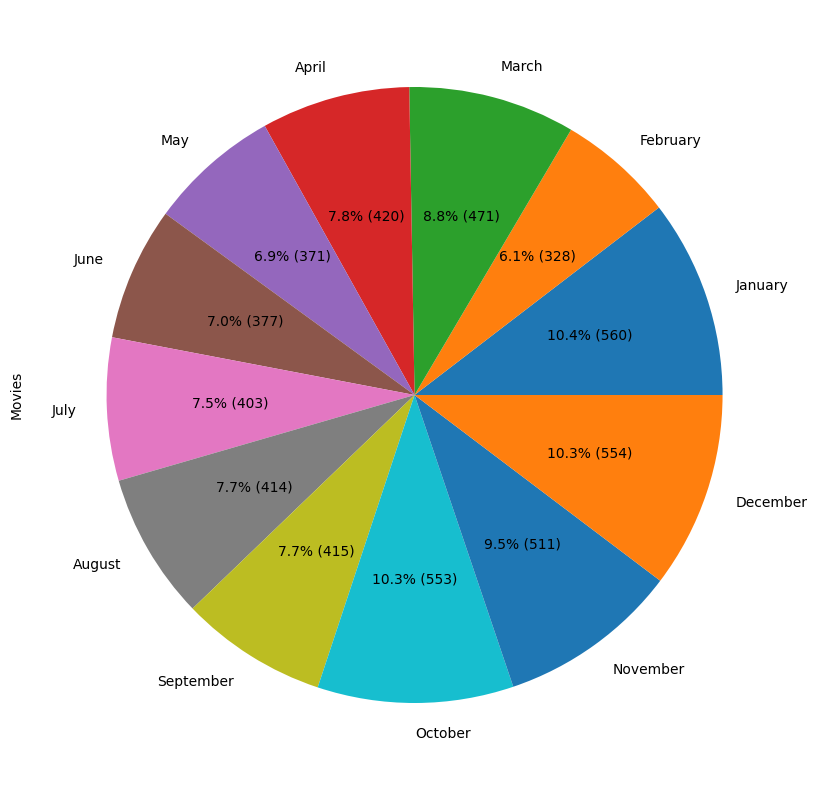

In [11]:
"Tạo 2 hàm code Hàm get_info7(nx_df, title): và Hàm content_additions_per_month(): Với việc kết hợp cả hai hàm, người dùng có thể dễ dàng theo dõi và hiểu được việc bổ sung nội dung trên Netflix theo từng tháng, qua đó cung cấp thông tin hữu ích về xu hướng và tiến triển của dịch vụ này."
def get_info7(nx_df, title):  # title is either 'Movie' or 'TV Show'
  # Lấy thông tin về loại và ngày được thêm vào
  info = nx_df[['type', 'date_added']].where(nx_df['type'] == title).dropna()
  # Chuyển 'date_added' thành chỉ chứa tháng được thêm vào
  info['date_added'] = info.apply(lambda row : str(row.date_added).split()[0], axis=1)
  # Nhóm các dòng theo 'date_added' và đếm số lượng dòng trong mỗi nhóm
  info = info.groupby(by=['date_added']).count().reset_index()
  # Đổi tên cột 'type' thành 'Movies' hoặc 'TV Shows', tùy thuộc vào giá trị của title
  info.rename({'type' : (title +'s')}, axis=1, inplace=True)
  # Chuyển 'date_added' thành cột dạng danh mục để có thể sắp xếp theo tháng
  info['date_added'] = pd.Categorical(info['date_added'], ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'])
  # Sắp xếp các dòng theo thứ tự tháng và đặt lại chỉ số của DataFrame thành 'date_added'
  info = info.sort_values('date_added').set_index('date_added')
  # Trả về DataFrame info chứa thông tin về số lượng phim hoặc chương trình truyền hình được thêm vào mỗi tháng
  return info


def content_additions_per_month():
  # Lấy thông tin về số lượng phim được thêm vào mỗi tháng
  movie_info = get_info7(nx_df, 'Movie')
  # Vẽ biểu đồ cột biểu thị số lượng phim được thêm vào mỗi tháng
  movie_info.plot(kind='bar', legend=False, width=0.8, xlabel='Tháng',
              ylabel='Bổ sung', title='Bổ sung nội dung Netflix mỗi năm', figsize = (11, 6))
  # Xoay nhãn trục x để dễ đọc và hiển thị biểu đồ cột
  plt.xticks(rotation=45)
  plt.show()
  print()  # In một dòng trống để tạo khoảng cách
  # Tính tổng số lượng phim được thêm vào
  total_movies = movie_info['Movies'].sum()
  # Vẽ biểu đồ tròn biểu thị phần trăm số lượng phim được thêm vào theo tổng số lượng phim
  movie_info.plot(kind = 'pie', subplots=True, figsize = (10, 10), legend=False,
                  autopct=lambda p: '{:.1f}% ({:.0f})'.format(p, (p/100)*total_movies))
  plt.show()

content_additions_per_month()  # Gọi hàm để thực thi toàn bộ quy trình


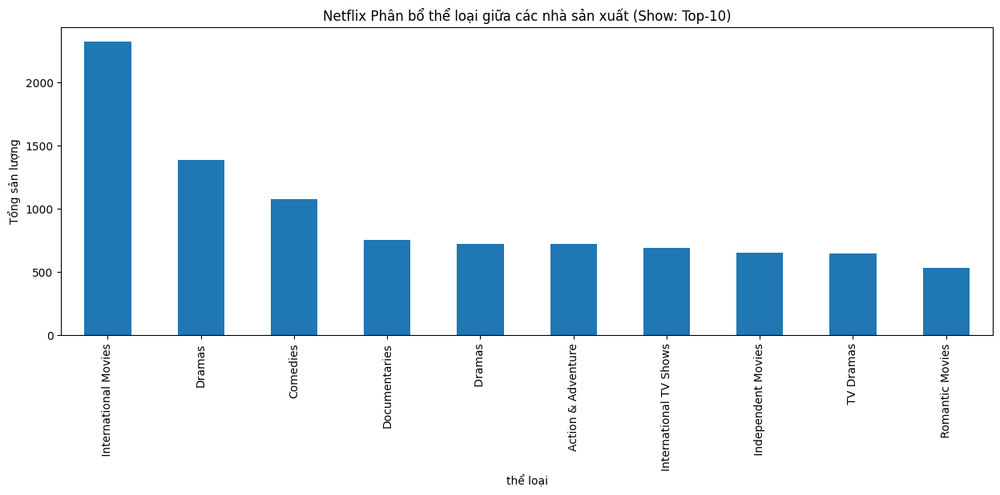

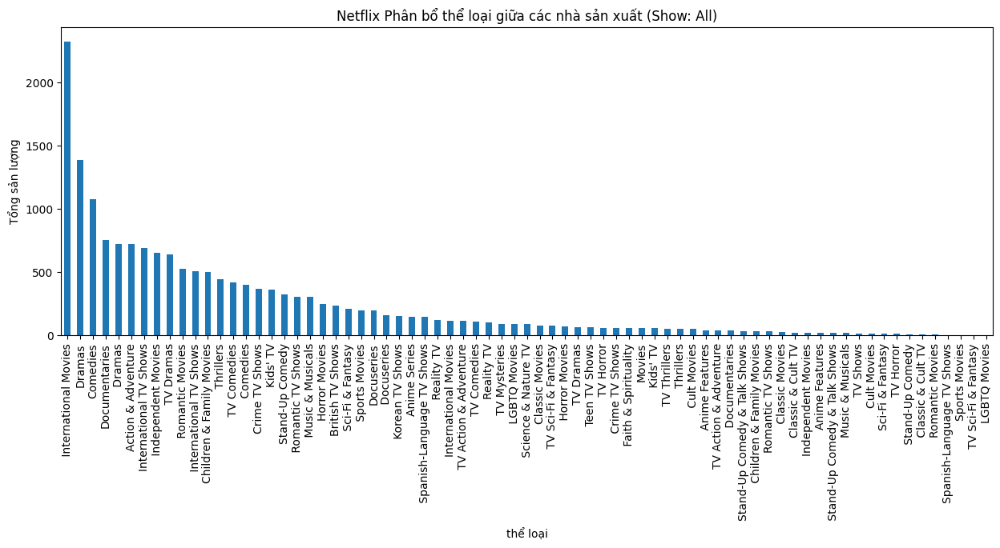

In [12]:
" Tạo hàm code này cung cấp một cái nhìn tổng quan về phân phối thể loại phim trên Netflix và cho phép người dùng dễ dàng hiểu về những thể loại phim được sản xuất nhiều nhất trên nền tảng này."
def get_genre_stats(topk = 8):
  # Lấy thông tin về thể loại và loại bỏ các dòng có giá trị NaN, sau đó đổi tên cột thành 'Genre'
  genre_info = nx_df[['listed_in']].dropna().rename({'listed_in' : 'Genre'}, axis=1)
  # Tạo các dòng mới, mỗi dòng chứa đúng 1 thể loại (bằng cách tách các phim có nhiều thể loại)
  genre_info['Genre'] = genre_info['Genre'].str.strip().str.split(',')
  genre_info = genre_info.explode('Genre')  # Chia các dòng thành từng dòng riêng lẻ theo từng thể loại
  genre_info = genre_info.reset_index()
  # Nhóm các dòng theo 'Genre' và đếm số lượng dòng trong mỗi nhóm
  genre_info = genre_info.groupby(by=['Genre']).count()
  # Đổi tên cột 'index' thành 'Count'
  genre_info.rename({'index' : 'Count'}, axis=1, inplace=True)
  # Sắp xếp các dòng theo số lượng dựa trên cột 'Count' theo thứ tự giảm dần
  genre_info = genre_info.sort_values(by=['Count'], ascending=False)

  def plot_topk_genre(info, topk):
    # Mô tả cho biểu đồ dựa trên giá trị của topk
    desc = f'(Show: Top-{topk})'
    if topk == len(genre_info.index):
      desc = '(Show: All)'
    # Vẽ biểu đồ cột cho topk thể loại đầu tiên
    genre_info.head(topk).plot(kind='bar', width=0.5, xlabel='thể loại', legend=False, figsize = (15,5),
                          ylabel='Tổng sản lượng', title=f'Netflix Phân bổ thể loại giữa các nhà sản xuất {desc}')
    plt.show()
    print()

  # Gọi hàm plot_topk_genre() để vẽ biểu đồ cho topk thể loại và tất cả các thể loại
  plot_topk_genre(genre_info, topk)
  plot_topk_genre(genre_info, genre_info.size)

# Gọi hàm get_genre_stats() với tham số topk mặc định là 10
get_genre_stats(topk = 10)


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 [Text(0, 0, 'United States'),
  Text(1, 0, 'India'),
  Text(2, 0, 'United Kingdom'),
  Text(3, 0, 'Canada'),
  Text(4, 0, 'France'),
  Text(5, 0, 'Japan'),
  Text(6, 0, 'Spain'),
  Text(7, 0, 'South Korea'),
  Text(8, 0, 'Germany'),
  Text(9, 0, 'Mexico'),
  Text(10, 0, 'China'),
  Text(11, 0, 'Australia'),
  Text(12, 0, 'Egypt'),
  Text(13, 0, 'Turkey'),
  Text(14, 0, 'Hong Kong'),
  Text(15, 0, 'Italy'),
  Text(16, 0, 'Brazil'),
  Text(17, 0, 'Taiwan'),
  Text(18, 0, 'Belgium'),
  Text(19, 0, 'Argentina')])

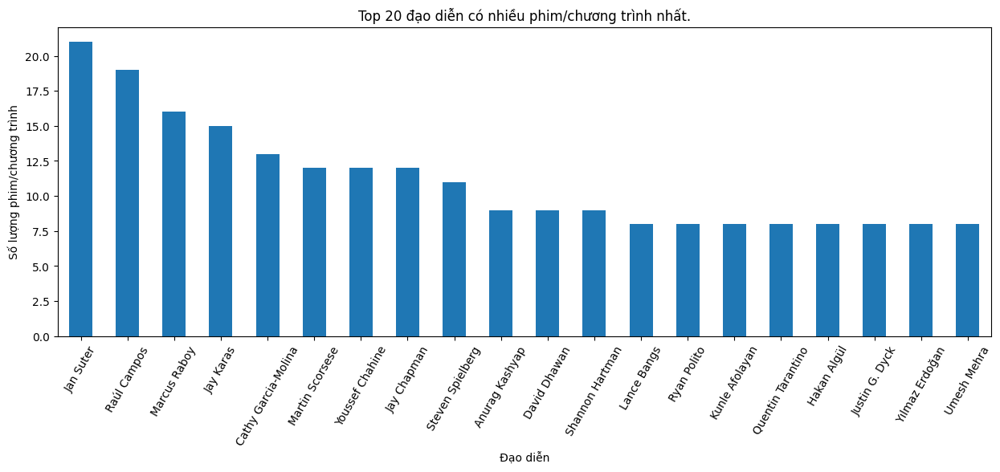

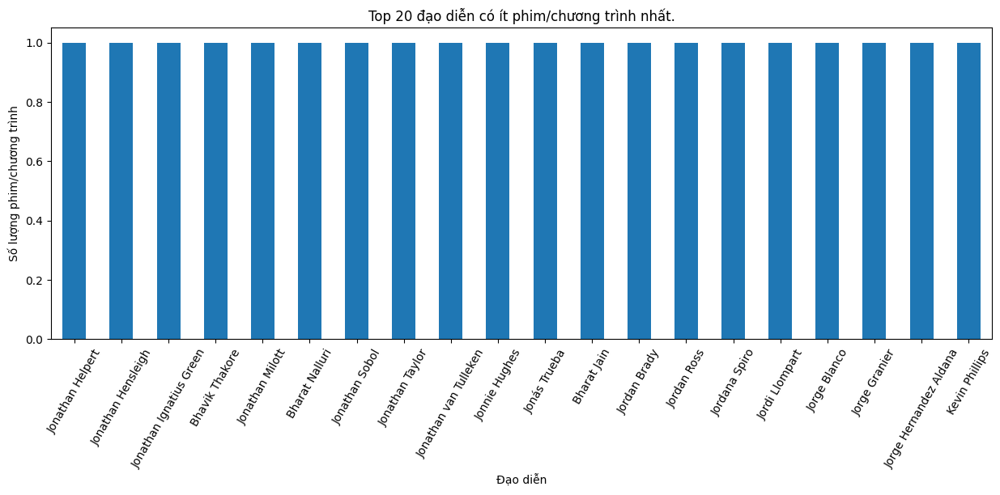

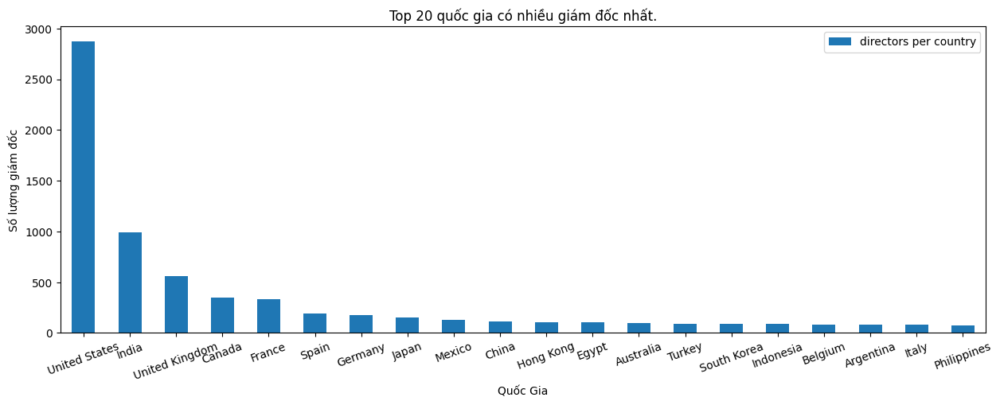

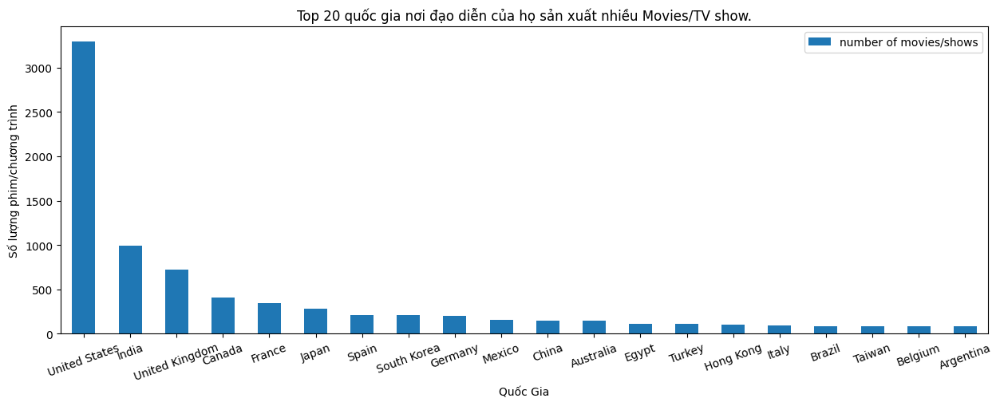

In [13]:
"Tạo Hàm code này được sử dụng để phân tích dữ liệu về các đạo diễn và quốc gia xuất hiện trong tập dữ liệu, sau đó trực quan hóa các kết quả dưới dạng biểu đồ cột để hiển thị số lượng phim hoặc show được sản xuất bởi mỗi đạo diễn hoặc từ mỗi quốc gia."
'''
Hàm tiện ích:
> Phân tách các trường của một cột cụ thể thành nhiều hàng đơn lẻ
> Làm sạch bất kỳ dấu cách và '\n' nào từ các trường của một cột cụ thể
'''
def clean_explode(df, column):
    # Loại bỏ dấu cách và phân tách các giá trị trong cột bằng dấu phẩy
    df[column] = df[column].str.strip().str.split(',')
    # Chia nhỏ DataFrame thành nhiều hàng dựa trên các giá trị trong cột đã chỉ định
    df = df.explode(column)
    # Làm sạch bất kỳ dấu cách nào xuất hiện sau khi phân tách
    df[column] = df[column].apply(lambda x: str(x).strip())
    # Đặt lại chỉ số của DataFrame
    df = df.reset_index(drop=True)
    return df

top_n = 20
# Chọn chỉ các trường đạo diễn và ID của show
directors = nx_df[['director', 'show_id']]
# Loại bỏ các hàng chứa giá trị không có ý nghĩa hoặc thiếu thông tin
directors.dropna(inplace=True)
# Đặt lại chỉ số của DataFrame
directors = directors.reset_index(drop=True)

# Tách các giá trị trong cột "director" và làm sạch
directors = clean_explode(directors, 'director')
# Đếm số lượng show mà mỗi đạo diễn đã sản xuất
directors = pd.DataFrame(directors.groupby(by=['director']).count()).reset_index()
directors.columns = ['director', 'count']
# Sắp xếp theo số lượng show giảm dần
directors.sort_values(by='count', ascending=False, inplace=True)

# Vẽ biểu đồ cho top N kết quả
directors.head(top_n).plot(x='director', y='count', kind='bar', xlabel='Đạo diễn', ylabel='Số lượng phim/chương trình',
                           figsize=[15, 5], legend=False, title=f'Top {top_n} đạo diễn có nhiều phim/chương trình nhất.')
plt.xticks(rotation=60)

# Vẽ biểu đồ cho top N kết quả (đối với các giá trị ít nhất)
directors.tail(top_n).plot(x='director', y='count', kind='bar', xlabel='Đạo diễn', ylabel='Số lượng phim/chương trình',
                           figsize=[15, 5], legend=False, title=f'Top {top_n} đạo diễn có ít phim/chương trình nhất.')
plt.xticks(rotation=60)

# Chọn chỉ các trường đạo diễn và quốc gia
dir_per_countr = nx_df[['country', 'director']]
# Loại bỏ các hàng chứa giá trị không có ý nghĩa hoặc thiếu thông tin
dir_per_countr.dropna(inplace=True)
# Đặt lại chỉ số của DataFrame
dir_per_countr.reset_index(drop=True, inplace=True)

# Tách các giá trị trong cột "country" và "director", và làm sạch
dir_per_countr = clean_explode(dir_per_countr, 'country')
dir_per_countr = clean_explode(dir_per_countr, 'director')

# Đếm số lượng đạo diễn trong mỗi quốc gia
dir_per_countr = pd.DataFrame(dir_per_countr.groupby(by=['country']).count()).reset_index()
dir_per_countr.columns = ['country', 'directors per country']
# Loại bỏ các giá trị không hợp lệ
dir_per_countr = dir_per_countr.replace(to_replace='', value=float('NaN'))
dir_per_countr.dropna(inplace=True)
# Sắp xếp theo số lượng đạo diễn giảm dần
dir_per_countr.sort_values(by='directors per country', ascending=False, inplace=True)

# Vẽ biểu đồ cho top N kết quả
dir_per_countr.head(top_n).plot(x='country', y='directors per country', kind='bar', xlabel='Quốc Gia', ylabel='Số lượng giám đốc',
        figsize=[15, 5], title=f'Top {top_n} quốc gia có nhiều giám đốc nhất.')
plt.xticks(rotation=20)

# Đếm tổng số lượng show mà các đạo diễn từ mỗi quốc gia đã sản xuất
prod_per_dirs = nx_df[['country', 'show_id']]
prod_per_dirs.dropna(inplace=True)
prod_per_dirs.reset_index(drop=True, inplace=True)

prod_per_dirs = clean_explode(prod_per_dirs, 'country')

prod_per_dirs = pd.DataFrame(prod_per_dirs.groupby(by=['country']).count()).reset_index()
prod_per_dirs.columns = ['country', 'number of movies/shows']

prod_per_dirs = prod_per_dirs.replace(to_replace='', value=float('NaN'))
prod_per_dirs.dropna(inplace=True)
prod_per_dirs.sort_values(by='number of movies/shows', ascending=False, inplace=True)

# Vẽ biểu đồ cho top N kết quả
prod_per_dirs.head(top_n).plot(x='country', y='number of movies/shows', kind='bar', xlabel='Quốc Gia', ylabel='Số lượng phim/chương trình',
        figsize=[15, 5], title=f'Top {top_n} quốc gia nơi đạo diễn của họ sản xuất nhiều Movies/TV show.')
plt.xticks(rotation=20)


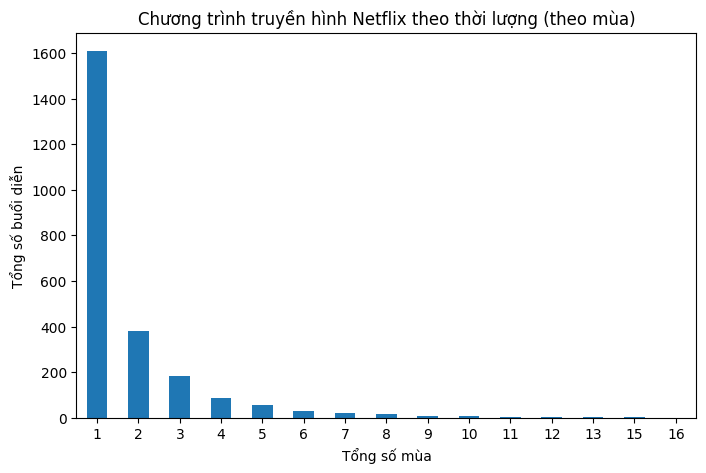

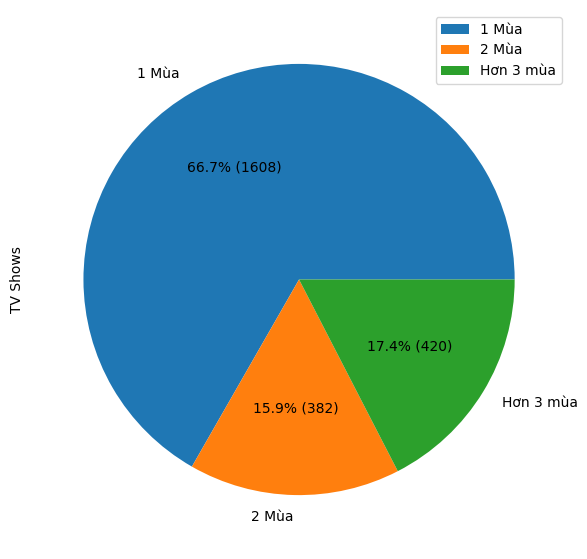

In [14]:
"Hàm code này được sử dụng để phân tích và hiển thị phân phối của các chương trình truyền hình trên Netflix dựa trên số lượng mùa của chúng."
# Định nghĩa hàm categorize_series(duration) để phân loại số mùa của một show TV thành các nhóm khác nhau
def categorize_series(duration):
    # Nếu số mùa lớn hơn hoặc bằng 3, gán nhãn '3+ Seasons'
    if duration >= 3:
        return 'Hơn 3 mùa'
    # Mặc định, gán hậu tố rỗng
    sufix = ''
    # Nếu số mùa là 2, thêm hậu tố 's'
    if duration == 2:
        sufix = ''
    # Trả về chuỗi biểu diễn số mùa kèm theo hậu tố nếu có
    return str(duration) + ' Mùa' + sufix

# Định nghĩa hàm shows_per_seasons() để hiển thị phân phối của các show TV theo số mùa
def shows_per_seasons():
    # Chọn chỉ các trường 'type' và 'duration' cho các show TV và loại bỏ các hàng chứa giá trị không hợp lệ
    show_info = nx_df[['type', 'duration']].where(nx_df['type'] == 'TV Show').dropna()
    # Chuyển đổi 'duration' thành số (int) biểu diễn số mùa cho mỗi show
    show_info['duration'] = show_info.apply(lambda row: int(str(row.duration).strip().split()[0]), axis=1)
    # Nhóm các show theo số mùa
    show_info = show_info.groupby(by=['duration']).count()
    # Sắp xếp các giá trị theo số mùa
    show_info = show_info.sort_values(by=['duration'])
    # Đổi tên cột 'type' thành 'TV Shows'
    show_info.rename({'type': 'TV Shows'}, axis=1, inplace=True)
    # Vẽ biểu đồ cột cho số lượng show theo số mùa, đặt các thông số cho biểu đồ và hiển thị nó
    show_info.plot(kind='bar', width=0.5, xlabel='Tổng số mùa', legend=False, figsize=(8, 5),
                   ylabel='Tổng số buổi diễn', title='Chương trình truyền hình Netflix theo thời lượng (theo mùa)')
    plt.xticks(rotation=0)
    plt.show()
    print()

    # Hiển thị phân phối của các show trong các nhóm mùa khác nhau (1, 2, 3+)
    show_info = show_info.reset_index()
    # Sử dụng hàm categorize_series() để phân loại các show vào các nhóm mùa khác nhau
    show_info['duration'] = show_info.apply(lambda row: categorize_series(row.duration), axis=1)
    # Nhóm các show theo nhóm mùa
    show_info = show_info.groupby(by=['duration']).sum()
    # Tính tổng số show
    total_shows = show_info['TV Shows'].sum()
    # Vẽ biểu đồ pie để hiển thị phân phối và tỷ lệ phần trăm của các nhóm mùa, và hiển thị nó
    show_info.plot(kind='pie', subplots=True, figsize=(7, 7),
                   autopct=lambda p: '{:.1f}% ({:.0f})'.format(p, (p / 100) * total_shows))
    plt.show()

# Gọi hàm shows_per_seasons() để thực thi và hiển thị phân tích
shows_per_seasons()


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'Pulp Fiction'),
  Text(1, 0, "Schindler's List"),
  Text(2, 0, 'Inception'),
  Text(3, 0, 'Eh Janam Tumhare Lekhe'),
  Text(4, 0, 'Gol Maal'),
  Text(5, 0, 'Much Ado About Nothing'),
  Text(6, 0, 'City of God'),
  Text(7, 0, 'Koshish'),
  Text(8, 0, 'Ani... Dr. Kashinath Ghanekar'),
  Text(9, 0, 'Oththa Seruppu Size 7'),
  Text(10, 0, 'American History X'),
  Text(11, 0, 'Manto'),
  Text(12, 0, 'Mallesham'),
  Text(13, 0, 'Black Friday'),
  Text(14, 0, 'Merku Thodarchi Malai')])

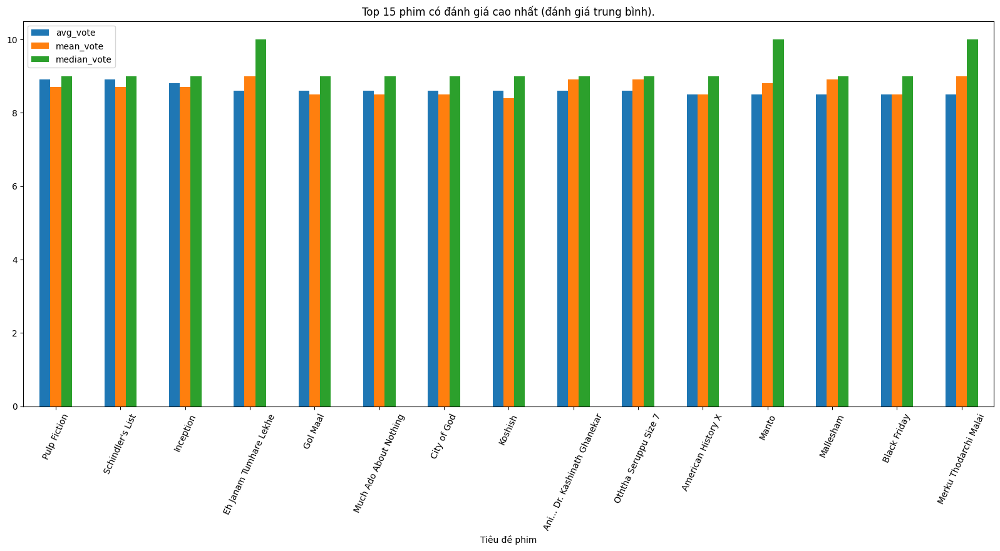

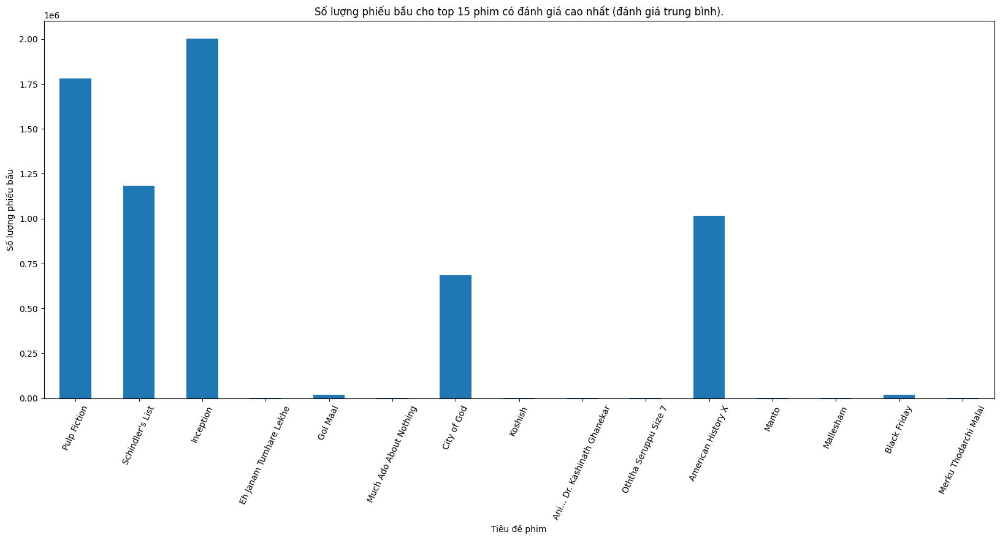

In [15]:
"Tạo hàm code này được sử dụng để thu thập thông tin về các bộ phim trên Netflix và kết hợp nó với thông tin từ cơ sở dữ liệu IMDb. Sau đó, nó trực quan hóa thông tin này dưới dạng biểu đồ để hiển thị các bộ phim có đánh giá cao nhất và số lượng phiếu bầu mà mỗi bộ phim đã nhận được."
# Thu thập tất cả các bộ phim từ Netflix
netfx = nx_df[['title']].where(nx_df['type'] == 'Movie').dropna()
# Thu thập id, đánh giá trung bình và trung vị từ IMDb ratings
imdb_ratings = imdb_r_df[['imdb_title_id', 'mean_vote', 'median_vote']].dropna()
# Thu thập id, tiêu đề, đánh giá trung bình và tổng số phiếu bầu từ IMDb movies
imdb_mov = imdb_m_df[['imdb_title_id', 'title', 'avg_vote', 'votes']].dropna()

# Kết hợp 2 bảng dữ liệu IMDb lại với nhau, dựa trên id của phim
imdb = imdb_ratings.join(imdb_mov.set_index('imdb_title_id'), on='imdb_title_id')

# Kết hợp (inner) bảng dữ liệu trước đó với các bộ phim Netflix theo tiêu đề
info = imdb.join(netfx.set_index('title'), on='title', how='inner')
info.reset_index(drop=True, inplace=True)

# Sắp xếp bảng dữ liệu cuối cùng dựa trên đánh giá trung bình
info = info.drop(columns='imdb_title_id').sort_values(by='avg_vote', ascending=False)

# Vẽ biểu đồ kết quả
top_n = 15
info.head(top_n).plot(x='title', y=['avg_vote', 'mean_vote', 'median_vote'], kind='bar', xlabel='Tiêu đề phim',
        figsize=[20, 8], title=f'Top {top_n} phim có đánh giá cao nhất (đánh giá trung bình).')

plt.xticks(rotation=65)

info.head(top_n).plot(x='title', y='votes', kind='bar', xlabel='Tiêu đề phim', ylabel='Số lượng phiếu bầu', label=False,
        figsize=[20, 8], title=f'Số lượng phiếu bầu cho top {top_n} phim có đánh giá cao nhất (đánh giá trung bình).', legend=False)

plt.xticks(rotation=65)


In [16]:
"Nội dung 1: Xử lí dữ liệu"
"Tạo code Hàm này chuyển đổi văn bản thành danh sách các từ gốc và loại bỏ các dấu câu và đại từ."
import pandas as pd  # Import thư viện Pandas và tạo việc gọi ngắn gọn là 'pd'

from sklearn.feature_extraction.text import CountVectorizer as cvect  # Import hàm CountVectorizer từ sklearn và tạo việc gọi ngắn gọn là 'cvect'
from sklearn.feature_extraction.text import TfidfVectorizer as tfvect  # Import hàm TfidfVectorizer từ sklearn và tạo việc gọi ngắn gọn là 'tfvect'

import nltk  # Import thư viện nltk
from nltk.corpus import stopwords  # Import danh sách các stopwords từ nltk.corpus
nltk.download('stopwords')  # Tải stopwords nếu chưa có

import spacy  # Import thư viện spacy
nlp = spacy.load('en_core_web_sm')  # Tải một mô hình ngôn ngữ tiếng Anh nhỏ từ spacy

# Hàm lambda để trả về danh sách các lemmas của từng từ trong văn bản, loại bỏ dấu câu và đại từ
lemmatok = lambda doc: [token.lemma_ for token in nlp(doc) if token.lemma_ != '-PRON-' and not token.is_punct]


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\nusyu\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [17]:

"tạo hàm code này được sử dụng để tiền xử lý dữ liệu văn bản trong DataFrame nx_df. Cụ thể:"
"Lemmatization: Chuyển đổi các từ trong cột 'description' và 'title' thành dạng gốc của chúng bằng cách sử dụng hàm lemmatok."
"Kết hợp mô tả và tiêu đề: Ghép các mô tả và tiêu đề tương ứng của mỗi dòng lại với nhau thành một chuỗi duy nhất."
"Quá trình này giúp làm sạch dữ liệu văn bản và chuẩn bị nó cho các bước tiếp theo như vector hóa hoặc phân loại."
# Tạo một bản sao của DataFrame nx_df và gán vào biến nx_df_lem
nx_df_lem = nx_df.copy()

# Lemmatize tất cả các tiêu đề và mô tả
nx_df_lem['description'] = nx_df_lem['description'].apply(lambda x: " ".join(lemmatok(x)))
nx_df_lem['title'] = nx_df_lem['title'].apply(lambda x: " ".join(lemmatok(x)))

# Trích xuất các mô tả và tiêu đề và kết hợp chúng thành các chuỗi riêng biệt
desc_l = nx_df_lem['description'].to_list()
title_l = nx_df_lem['title'].to_list()
desc_titles = [(desc_l[i] + ' ' + title_l[i]) for i in range(len(desc_l))]


In [18]:
"Nội dung 2: Vector hóa dữ liệu"

"Biến đổi văn bản thành các vector đặc trưng bằng cách sử dụng Bag of Words với unigrams (từ đơn) và bigrams (cặp từ)."
"Tạo các DataFrame chứa các vector đặc trưng này để phân tích hoặc làm đầu vào cho các mô hình học máy."
"Mục đích chính là chuẩn bị dữ liệu văn bản để sử dụng trong các thuật toán học máy."

# Khai báo các vectorizers (unigram, bigram)
cv_uni = cvect(ngram_range=(1, 1), stop_words=stopwords.words(), min_df=5, max_df=0.96, max_features=3000, binary=True)
cv_bi = cvect(ngram_range=(2, 2), stop_words=stopwords.words(), min_df=2, binary=True)
cv_unibi = cvect(ngram_range=(1, 2), stop_words=stopwords.words(), min_df=2, max_features=4000, binary=True)

# Chuyển đổi
cv_tr_u = cv_uni.fit_transform(desc_titles)
cv_tr_b = cv_bi.fit_transform(desc_titles)
cv_tr_ub = cv_unibi.fit_transform(desc_titles)

# Tạo các DataFrame tương ứng

# DataFrame bao gồm các unigrams
cv_u_df = pd.DataFrame(cv_tr_u.toarray(), columns=cv_uni.get_feature_names_out(), index=nx_df_lem['show_id'])
# DataFrame bao gồm các bigrams
cv_b_df = pd.DataFrame(cv_tr_b.toarray(), columns=cv_bi.get_feature_names_out(), index=nx_df_lem['show_id'])
# DataFrame bao gồm cả unigrams và bigrams
cv_df = pd.DataFrame(cv_tr_ub.toarray(), columns=cv_unibi.get_feature_names_out(), index=nx_df_lem['show_id'])


In [19]:
"Hàm code trên được sử dụng để chuyển đổi các văn bản thành vectơ TF-IDF, biểu diễn tần suất của các từ và cặp từ trong văn bản để phục vụ cho việc phân tích và xử lý dữ liệu văn bản."
# TF-IDF

# Khai báo các vectorizer (unigram, bigram)
tf_uni = tfvect(ngram_range=(1, 1), stop_words=stopwords.words(), min_df=2, max_df=0.96, max_features=3000)
tf_bi = tfvect(ngram_range=(2, 2), stop_words=stopwords.words(), min_df=2)
tf_unibi = tfvect(ngram_range=(1, 2), stop_words=stopwords.words(), min_df=2, max_features=4000)

# Chuyển đổi
tf_tr_u = tf_uni.fit_transform(desc_titles)
tf_tr_b = tf_bi.fit_transform(desc_titles)
tf_tr_ub = tf_unibi.fit_transform(desc_titles)

# Tạo các dataframes tương ứng

# DataFrame chứa các unigram
tf_u_df = pd.DataFrame(tf_tr_u.toarray(), columns=tf_uni.get_feature_names_out(), index=nx_df_lem['show_id'])
# DataFrame chứa các bigram
tf_b_df = pd.DataFrame(tf_tr_b.toarray(), columns=tf_bi.get_feature_names_out(), index=nx_df_lem['show_id'])
# DataFrame chứa cả unigram và bigram
tf_df = pd.DataFrame(tf_tr_ub.toarray(), columns=tf_unibi.get_feature_names_out(), index=nx_df_lem['show_id'])


In [20]:
# Nhập hàm cdist từ module scipy.spatial.distance
from scipy.spatial.distance import cdist


In [21]:
'''
Hàm này tính độ tương tự giữa hai tập hợp các dataframe sử dụng một phép đo cụ thể.

Tham số:
    df1: DataFrame - Tập hợp dataframe thứ nhất.
    df2: DataFrame - Tập hợp dataframe thứ hai.
    metric: str hoặc callable - Phép đo được sử dụng để tính độ tương tự.

Trả về:
    similarity_matrix: list of lists - Một danh sách 2D chứa độ tương tự giữa mỗi cặp inputs.
'''
def similar(df1, df2, metric):
    # Tính độ tương tự giữa hai tập hợp dataframe và trả về.
    return 1 - cdist(df1, df2, metric)


In [22]:
"Nội dung 3: tính toán độ tương tự"
# BoW - unigram
# Tính độ tương tự giữa các unigram của tập hợp BoW và chính nó bằng phương pháp Jaccard.
cv_uni_sim = similar(cv_u_df, cv_u_df, 'jaccard')

# BoW - bigram
# Tính độ tương tự giữa các bigram của tập hợp BoW và chính nó bằng phương pháp Jaccard.
cv_bi_sim = similar(cv_b_df, cv_b_df, 'jaccard')

# BoW unigram & bigram
# Tính độ tương tự giữa tập hợp BoW unigram và bigram với chính nó bằng phương pháp Jaccard.
cv_sim = similar(cv_df, cv_df, 'jaccard')


In [23]:

# TF-IDF - unigram
# Tính độ tương tự giữa các unigram của tập hợp TF-IDF và chính nó bằng phương pháp Cosine Similarity.
tf_uni_sim = similar(tf_u_df, tf_u_df, 'cosine')

# TF-IDF - bigram
# Tính độ tương tự giữa các bigram của tập hợp TF-IDF và chính nó bằng phương pháp Cosine Similarity.
tf_bi_sim = similar(tf_b_df, tf_b_df, 'cosine')

# TF-IDF unigram & bigram
# Tính độ tương tự giữa tập hợp TF-IDF unigram và bigram với chính nó bằng phương pháp Cosine Similarity.
tf_sim = similar(tf_df, tf_df, 'cosine')


In [24]:
def dict_prep(l):
    d = {}
    # Tạo các khóa
    for i in range(len(l)):
        idx = 's' + str(i+1) 
        d[idx] = l[i]

    # Tạo các bộ tuples tương ứng, sắp xếp chúng và giữ lại 100 bộ tuples hàng đầu
    for j, key in enumerate(d):
        l = list(d[key])
        d[key] = [(l[i], 's' + str(i+1)) for i in range(len(l))]
        # Loại bỏ các bộ tuples có cùng khóa với bộ tuples hiện tại
        d[key] = [k for k in d[key] if k[1] != key]
        # Sắp xếp theo thứ tự giảm dần
        d[key].sort(reverse=True)
        # Giữ lại 100 bộ tuples hàng đầu
        d[key] = d[key][:100]

    return d


In [25]:
# Tạo tất cả các từ điển cần thiết
cv_uni_sim = dict_prep(cv_uni_sim) 
cv_bi_sim = dict_prep(cv_bi_sim) 
cv_sim = dict_prep(cv_sim) 

tf_uni_sim = dict_prep(tf_uni_sim) 
tf_bi_sim = dict_prep(tf_bi_sim) 
tf_sim = dict_prep(tf_sim) 


In [26]:
# Hàm để in thông tin thống kê một cách đẹp mắt
def pretty_print(l, title, N):
    print(f'Top {N} recommended productions for "{title}":')
    print('-----------------------------------------------')
    print('INDEX -- TITLE -- SIMILARITY')
    for i, (est, t) in enumerate(l):
        print(f'{i+1}. -- {t} -- {str(est)[:4]}')


In [27]:
"Nội dung 4: đề xuất bộ phim dựa trên tiêu đề"
'''
Nhận vào một tiêu đề phim, một số, một phương pháp và một bộ ba ngram
Trả về "N" phim tương tự nhất với tiêu đề phim đã cho

Nếu "method" là "boolean", thông tin được trích xuất từ tập dữ liệu huấn luyện của phương pháp BoW
Nếu "method" là "tf-idf", thông tin được trích xuất từ tập dữ liệu huấn luyện của phương pháp TF-IDF

Nếu "ngram" là (1, 1), thông tin chỉ được trích xuất từ tập dữ liệu được huấn luyện trên unigram
Nếu "ngram" là (1, 2), thông tin được trích xuất từ tập dữ liệu được huấn luyện trên unigram và bigram
Nếu "ngram" là (2, 2), thông tin chỉ được trích xuất từ tập dữ liệu được huấn luyện trên bigram
'''
def get_similar_movies1(movie_title, N=10, method='boolean', ngram=(1, 2)):
    # Thử và lấy id của bộ phim được cho
    try:
        id = nx_df[nx_df['title'] == movie_title]['show_id'].values[0]
    except:
        print(f'Lỗi, "{movie_title}" không tồn tại trong cơ sở dữ liệu.')
        return None

    sims = None
    # Phương pháp boolean
    if method == 'boolean':
        # Trích xuất danh sách phim tương tự phù hợp từ một tập dữ liệu đã được huấn luyện
        sdata = cv_uni_sim[id] if ngram==(1, 1) else cv_sim[id] if ngram==(1, 2)  \
                else cv_bi_sim[id] if ngram==(2, 2) else None

        if sdata == None:
            print('Lỗi, tham số ngram phải là (1, 1), (1, 2) hoặc (2, 2).')
            return sdata
        # Chỉ giữ lại "N" phim hàng đầu
        sims = sdata[:N]

    # Phương pháp TF-IDF
    elif method == 'tf-idf':
        # Trích xuất danh sách phim tương tự phù hợp từ một tập dữ liệu đã được huấn luyện
        sdata = tf_uni_sim[id] if ngram==(1, 1) else tf_sim[id] if ngram==(1, 2)  \
                else tf_bi_sim[id] if ngram==(2, 2) else None
        
        if sdata == None:
            print('Lỗi, tham số ngram phải là (1, 1), (1, 2) hoặc (2, 2).')
            return sdata
        sims = sdata[:N]
        
    else:
        print('Lỗi, tham số method phải là "boolean" hoặc "tf-idf".')
        return None
    # Trả về danh sách tiêu đề phim kết quả và tỷ lệ tương tự thay vì các id phim
    return [(val, nx_df[nx_df['show_id'] == id2]['title'].values[0]) for (val, id2) in sims]


In [31]:
"ví dụ 10 tiêu đề:"
"Breaking Bad"
"Stranger Things"
"The Crown"
"Money Heist"
"Narcos"
"Black Mirror"
"Game of Thrones"
"The Witcher"
"The Mandalorian"
"Dark"
N = 10
mtitle = 'Surviving Escobar - Alias JJ'

print(f'\n\n[Boolean - Unigrams]> Top {N} Các bộ phim được đề xuất hàng đầu cho "{mtitle}" : \n')
pretty_print(get_similar_movies1(mtitle, method='boolean', ngram=(1, 1)), mtitle, N)

print(f'\n\n[Boolean - Unigrams & Bigrams]> Top {N} Các bộ phim được đề xuất hàng đầu cho "{mtitle}" : \n')
pretty_print(get_similar_movies1(mtitle, method='boolean', ngram=(1, 2)), mtitle, N)

print(f'\n\n[Boolean - Bigrams]> Top {N} Các bộ phim được đề xuất hàng đầu cho "{mtitle}" : \n')
pretty_print(get_similar_movies1(mtitle, method='boolean', ngram=(2, 2)), mtitle, N)

print(f'\n\n[TF-IDF - Unigrams]> Top {N} Các bộ phim được đề xuất hàng đầu cho "{mtitle}" : \n')
pretty_print(get_similar_movies1(mtitle, method='tf-idf', ngram=(1, 1)), mtitle, N)

print(f'\n\n[TF-IDF - Unigrams & Bigrams]> Top {N} Các bộ phim được đề xuất hàng đầu cho "{mtitle}" : \n')
pretty_print(get_similar_movies1(mtitle, method='tf-idf', ngram=(1, 2)), mtitle, N)

print(f'\n\n[TF-IDF - Bigrams]> Top {N} Các bộ phim được đề xuất hàng đầu cho "{mtitle}" : \n')
pretty_print(get_similar_movies1(mtitle, method='tf-idf', ngram=(2, 2)), mtitle, N)

mtitle = 'Last Breath'

print(f'\n\n[Boolean - Unigrams]> Top {N} Các bộ phim được đề xuất hàng đầu cho "{mtitle}" : \n')
pretty_print(get_similar_movies1(mtitle, method='boolean', ngram=(1, 1)), mtitle, N)

print(f'\n\n[Boolean - Unigrams & Bigrams]> Top {N} Các bộ phim được đề xuất hàng đầu cho "{mtitle}" : \n')
pretty_print(get_similar_movies1(mtitle, method='boolean', ngram=(1, 2)), mtitle, N)

print(f'\n\n[Boolean - Bigrams]> Top {N} Các bộ phim được đề xuất hàng đầu cho "{mtitle}" : \n')
pretty_print(get_similar_movies1(mtitle, method='boolean', ngram=(2, 2)), mtitle, N)

print(f'\n\n[TF-IDF - Unigrams]> Top {N} Các bộ phim được đề xuất hàng đầu cho "{mtitle}" : \n')
pretty_print(get_similar_movies1(mtitle, method='tf-idf', ngram=(1, 1)), mtitle, N)

print(f'\n\n[TF-IDF - Unigrams & Bigrams]> Top {N} Các bộ phim được đề xuất hàng đầu cho "{mtitle}" : \n')
pretty_print(get_similar_movies1(mtitle, method='tf-idf', ngram=(1, 2)), mtitle, N)

print(f'\n\n[TF-IDF - Bigrams]> Top {N} Các bộ phim được đề xuất hàng đầu cho "{mtitle}" : \n')
pretty_print(get_similar_movies1(mtitle, method='tf-idf', ngram=(2, 2)), mtitle, N)




[Boolean - Unigrams]> Top 10 Các bộ phim được đề xuất hàng đầu cho "Dark" : 

Top 10 recommended productions for "Dark":
-----------------------------------------------
INDEX -- TITLE -- SIMILARITY
1. -- Wakfu -- 0.15
2. -- Dark Light -- 0.15
3. -- Riverdale -- 0.14
4. -- The Little Nyonya -- 0.13
5. -- THE STRANGER -- 0.13
6. -- Safe -- 0.13
7. -- Hold the Dark -- 0.13
8. -- Black Mirror: Bandersnatch -- 0.12
9. -- Tukaram -- 0.11
10. -- DRIFTING DRAGONS -- 0.11


[Boolean - Unigrams & Bigrams]> Top 10 Các bộ phim được đề xuất hàng đầu cho "Dark" : 

Top 10 recommended productions for "Dark":
-----------------------------------------------
INDEX -- TITLE -- SIMILARITY
1. -- Black Mirror: Bandersnatch -- 0.15
2. -- Riverdale -- 0.13
3. -- Inception -- 0.13
4. -- The Little Nyonya -- 0.13
5. -- Dark Light -- 0.13
6. -- Wakfu -- 0.12
7. -- Hold the Dark -- 0.12
8. -- THE STRANGER -- 0.12
9. -- ANIMA -- 0.12
10. -- Safe -- 0.11


[Boolean - Bigrams]> Top 10 Các bộ phim được đề xuất hàng

In [29]:
"Nội dung 5: đề xuất bộ phim dựa trên mô tả"
'''
Nhận mô tả, số, phương thức và bộ dữ liệu ngram
Trả về "N" phim giống nhất với từ khóa/mô tả đã cho

Nếu "phương thức" là "boolean", thông tin đang được huấn luyện bằng phương pháp BoW
Nếu "phương thức" là "tf-idf", thông tin đang được huấn luyện bằng phương pháp TF-IDF

Nếu "ngram" là (1, 1) thì thông tin chỉ được trích xuất từ ​​tập được huấn luyện trên unigrams
Nếu "ngram" là (1, 2), thông tin được trích xuất từ ​​tập được huấn luyện về unigram và bigram
Nếu "ngram" là (2, 2) thì thông tin chỉ được trích xuất từ ​​tập được huấn luyện trên bigram
'''

def get_similar_movies2(descr, N=10, method='tf-idf', ngram=(1, 2)):
    # Nhận vào mô tả, số lượng kết quả, phương pháp, và tuple ngram
    # Trả về top "N" phim tương tự nhất dựa trên từ khóa/mô tả đã cho
    
    dsc = descr
    # Lemmatise the given description (Chuẩn hóa mô tả đầu vào)
    descr = " ".join(lemmatok(descr))
    # Thêm mô tả đã chuẩn hóa vào tập dữ liệu
    descriptions = nx_df_lem['description'].to_list() + [descr]
    # Thêm chỉ số cho mô tả của người dùng
    new_indices = pd.concat([nx_df_lem['show_id'], pd.Series(['User arg'])])

    # Transform all the existing descriptions along with the user's input and create 
    # the appropriate DataFrames (based on the provided method & ngram)
    # (Chuyển đổi tất cả các mô tả hiện có cùng với đầu vào của người dùng và tạo DataFrames phù hợp)
    sims = None
    # Phương pháp boolean
    if method == 'boolean':
        df = None
        if ngram == (1, 2):
            # Fit and transform using unigrams and bigrams (Sử dụng unigrams và bigrams)
            tr_ub = cv_unibi.fit_transform(descriptions)
            df = pd.DataFrame(tr_ub.toarray(), columns=cv_unibi.get_feature_names_out(), index=new_indices)
        
        elif ngram == (1, 1):
            # Fit and transform using unigrams (Sử dụng unigrams)
            tr_u = cv_uni.fit_transform(descriptions)
            df = pd.DataFrame(tr_u.toarray(), columns=cv_uni.get_feature_names_out(), index=new_indices)

        elif ngram == (2, 2):
            # Fit and transform using bigrams (Sử dụng bigrams)
            tr_b = cv_bi.fit_transform(descriptions)
            df = pd.DataFrame(tr_b.toarray(), columns=cv_bi.get_feature_names_out(), index=new_indices)
        
        else:
            # Sai số nếu ngram không hợp lệ
            print('Error, ngram parameter has to be either (1, 1), (1, 2) or (2, 2).')
            return None

        # Giữ lại dataframe chỉ chứa vector đặc trưng đầu vào của người dùng
        df1 = df.tail(1)
        df.drop(df.tail(1).index, inplace=True)
        # Tính toán và chỉ giữ lại top "N" phim tương tự nhất với mô tả của người dùng qua hàm similar()
        sdata = dict_prep(similar(df1, df, 'jaccard'))
        sims = list(sdata.values())[0][:N]

    elif method == 'tf-idf':
        df = None
        if ngram == (1, 2):
            # Fit and transform using unigrams and bigrams with TF-IDF (Sử dụng TF-IDF với unigrams và bigrams)
            tr_ub = tf_unibi.fit_transform(descriptions)
            df = pd.DataFrame(tr_ub.toarray(), columns=tf_unibi.get_feature_names_out(), index=new_indices)

        elif ngram == (1, 1):
            # Fit and transform using unigrams with TF-IDF (Sử dụng TF-IDF với unigrams)
            tr_u = tf_uni.fit_transform(descriptions)
            df = pd.DataFrame(tr_u.toarray(), columns=tf_uni.get_feature_names_out(), index=new_indices)

        elif ngram == (2, 2):
            # Fit and transform using bigrams with TF-IDF (Sử dụng TF-IDF với bigrams)
            tr_b = tf_bi.fit_transform(descriptions)    
            df = pd.DataFrame(tr_b.toarray(), columns=tf_bi.get_feature_names_out(), index=new_indices)

        else:
            # Sai số nếu ngram không hợp lệ
            print('Error, ngram parameter has to be either (1, 1), (1, 2) or (2, 2).')
            return None
        
        # Giữ lại dataframe chỉ chứa vector đặc trưng đầu vào của người dùng
        df1 = df.tail(1)
        df.drop(df.tail(1).index, inplace=True)
        # Tính toán và chỉ giữ lại top "N" phim tương tự nhất với mô tả của người dùng qua hàm similar()
        sdata = dict_prep(similar(df1, df, 'cosine'))
        sims = list(sdata.values())[0][:N]
        
    else:
        # Sai số nếu phương pháp không hợp lệ
        print('Error, method parameter has to be either "boolean" or "tf-idf".')
        return None

    # Trả về tiêu đề phim và tỉ lệ tương tự thay vì id phim
    return [(val, nx_df[nx_df['show_id'] == id2]['title'].values[0]) for (val, id2) in sims]



In [30]:
"Vài ví dụ"
"Love story of teenagers at high school:"
"-Phim tình cảm học đường."
"Psychological thriller with psychic patients"":"
"-Phim kinh dị tâm lý về bệnh nhân tâm thần."
"Survival story in a post-apocalyptic world:"
"-Câu chuyện sinh tồn trong thế giới hậu tận thế."
"Adventure of a group of friends in a fantasy land:"
"-Cuộc phiêu lưu của một nhóm bạn trong vùng đất kỳ ảo."
"Comedy about daily life in a big city:"
"-Phim hài về cuộc sống hàng ngày ở thành phố lớn."
N = 10
dsc = 'Survival story in a post-apocalyptic world'

print(f'\n\n[Boolean - Unigrams]> Top {N} Sản phẩm được đề xuất dựa trên mô tả "{dsc}" : \n')
pretty_print(get_similar_movies2(dsc, method='boolean', ngram=(1, 1)), dsc, N)

print(f'\n\n[Boolean - Unigrams & Bigrams]> Top {N} Sản phẩm được đề xuất dựa trên mô tả "{dsc}" : \n')
pretty_print(get_similar_movies2(dsc, method='boolean', ngram=(1, 2)), dsc, N)

print(f'\n\n[Boolean - Bigrams]> Top {N} Sản phẩm được đề xuất dựa trên mô tả "{dsc}" : \n')
pretty_print(get_similar_movies2(dsc, method='boolean', ngram=(2, 2)), dsc, N)

print(f'\n\n[TF-IDF - Unigrams]> Top {N} Sản phẩm được đề xuất dựa trên mô tả "{dsc}" : \n')
pretty_print(get_similar_movies2(dsc, method='tf-idf', ngram=(1, 1)), dsc, N)

print(f'\n\n[TF-IDF - Unigrams & Bigrams]> Top {N} Sản phẩm được đề xuất dựa trên mô tả "{dsc}" : \n')
pretty_print(get_similar_movies2(dsc, method='tf-idf', ngram=(1, 2)), dsc, N)

print(f'\n\n[TF-IDF - Bigrams]> Top {N} Sản phẩm được đề xuất dựa trên mô tả "{dsc}" : \n')
pretty_print(get_similar_movies2(dsc, method='tf-idf', ngram=(2, 2)), dsc, N)


dsc = 'Psycological thriller with psychic patients'
print(f'\n\n[Boolean - Unigrams]> Top {N} Sản phẩm được đề xuất dựa trên mô tả "{dsc}" : \n')
pretty_print(get_similar_movies2(dsc, method='boolean', ngram=(1, 1)), dsc, N)

print(f'\n\n[Boolean - Unigrams & Bigrams]> Top {N} Sản phẩm được đề xuất dựa trên mô tả "{dsc}" : \n')
pretty_print(get_similar_movies2(dsc, method='boolean', ngram=(1, 2)), dsc, N)

print(f'\n\n[Boolean - Bigrams]> Top {N} Sản phẩm được đề xuất dựa trên mô tả "{dsc}" : \n')
pretty_print(get_similar_movies2(dsc, method='boolean', ngram=(2, 2)), dsc, N)

print(f'\n\n[TF-IDF - Unigrams]> Top {N} Sản phẩm được đề xuất dựa trên mô tả "{dsc}" : \n')
pretty_print(get_similar_movies2(dsc, method='tf-idf', ngram=(1, 1)), dsc, N)

print(f'\n\n[TF-IDF - Unigrams & Bigrams]> Top {N} Sản phẩm được đề xuất dựa trên mô tả "{dsc}" : \n')
pretty_print(get_similar_movies2(dsc, method='tf-idf', ngram=(1, 2)), dsc, N)

print(f'\n\n[TF-IDF - Bigrams]> Top {N} Sản phẩm được đề xuất dựa trên mô tả "{dsc}" : \n')
pretty_print(get_similar_movies2(dsc, method='tf-idf', ngram=(2, 2)), dsc, N)




[Boolean - Unigrams]> Top 10 Sản phẩm được đề xuất dựa trên mô tả "Survival story in a post-apocalyptic world" : 

Top 10 recommended productions for "Survival story in a post-apocalyptic world":
-----------------------------------------------
INDEX -- TITLE -- SIMILARITY
1. -- Tiny Creatures -- 0.21
2. -- The Barrier -- 0.19
3. -- Becoming Champions -- 0.18
4. -- The Day I Met El Chapo -- 0.18
5. -- La Reina del Sur -- 0.18
6. -- He Named Me Malala -- 0.18
7. -- Flavorful Origins -- 0.18
8. -- Elles étaient en guerre 1939-1945 -- 0.18
9. -- Brave Miss World -- 0.18
10. -- Sillu Karuppatti -- 0.16


[Boolean - Unigrams & Bigrams]> Top 10 Sản phẩm được đề xuất dựa trên mô tả "Survival story in a post-apocalyptic world" : 

Top 10 recommended productions for "Survival story in a post-apocalyptic world":
-----------------------------------------------
INDEX -- TITLE -- SIMILARITY
1. -- Tiny Creatures -- 0.19
2. -- The Day I Met El Chapo -- 0.18
3. -- La Reina del Sur -- 0.18
4. -- He Na